In [1]:
import seaborn as sns 
import pandas as pd 
import numpy as np 
from urllib.request import urlopen
from bs4 import BeautifulSoup
sns.set_theme()
import tensorflow as tf
from sklearn.linear_model import LinearRegression
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping
tf.random.set_seed(16)
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
import re
from cleantext import clean
from nltk.corpus import stopwords
import nltk
from unidecode import unidecode
import requests
from wordcloud import WordCloud
import unittest
import statsmodels.graphics.tsaplots as sgt
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
import os

<h1> Exploring the Interplay Between Industrial Activity, Greenhouse Gas Emissions, and Rising Temperatures

## *Implications for Hazardous Natural Disasters in Serbia and rest of Europe from 2014 onwards*

<h2> 1. Introduction 

This continuation of the analysis of the natural disasters that took place between 2013 and 2023 in Eastern and Southern Europe (Rosca, 2023), looks at the various ways Serbia and other countries in Europe are conducting their activities and how that affects the amount of greenhouse gas emissions released into the atmosphere. 

As a reminder, the ending point of the last piece of research discussed how many natural disasters took place in Europe in the last 10 years. The EDA highlighted that several disasters took place, however the most impactful ones were one that took place in Czech Republic in 2012, and one that took place in Serbia in 2014. 

The Serbian natural disaster was a flood that affected over 1600000 people and it stemmed from an increased number of precipitations in the area, due to a release of greenhouse gas emissions from industrial activity. This can be either urbanisation, pollution, agriculture, deforestation etc. Even though Serbia is by no means the only country that contributes to GHG emissions, however, it is the country that has experienced one of the worst natural disaster seen in Europe in the last 10 years and therefore requires more investigation. 

This new coursework follows the same trajectory as before, but looks in detail at greenhouse gas emissions, what are they, why are they important, what can be done to mitigate their effect on the global population. 

This notebook combines data several dataframes concerned with temperature changes accross Europe and greenhouse gas emissions, as well as data cleaning, visualisations, and two models that predict the increase of temperature changes in the next 4 to 5 years. 

The starting point of the notebook is the dataframe cleaned and manipulated in coursework 1, concerned with the European temperature changes since 1961. 

In the below section, I will look at ethical considerations for the main sources of information and research, as well as the more important packages that I used for the code and data limitations. 

<h2> 1.1. Overall limitations of the analysis 

<h2> 2. Ethical considerations </h2> 

The ethical considerations listed in Rosca (2023), in the second section, titled "Data Description" continue to apply to this report. In continuation, this notebook also looks at the ethical considerations displayed by the main sources of information, such as Climate Trace and the IPCC Adaptation Report, that can be found below. 

<h4> 2.1 Climate Trace 

<h4> What is Climate Trace? </h4> 

Climate TRACE is a non-profit coalition of organizations building a timely, open, and accessible inventory of exactly where greenhouse gas emissions are coming from.

<h4> Why was Climate Trace started? </h4> 

According to their website, Climate trace started due to a lack of accessible and centralised location for all greenhouse gas emissions reports accross the globe. The Keeling Curve has given us the big-picture view of how much carbon dioxide is in the Earth’s atmosphere. However, the world needs additional information about exactly where and when greenhouse gas emissions are occurring in order to set actionable goals to reduce them and to track our progress toward these emissions reduction goals.

In order to see the biggest advantage of Climate Trace, we must know how are GHG emissions report. Until now, most emissions inventories have been based on self-reported, often years-late data that often had to rely on rough estimates, opaque methods, and inaccessible reporting. 

<h4> How does Climate Trace work? </h4> 

They analyze over 90 trillion bytes of data from more than 300 satellites, more than 11,000 sensors, and numerous additional sources of emissions information from all over the world. 

<h4> This sounds good, but how are they funded? </h4> 

Climate Trace is currently asking for financial support on their website, at https://climatetrace.org/support-us. Climate Trace is also funded by Google.org since May 2019. 

<h4> Who works and partners with Climate Trace? </h4> 

The members who are participating in the work done by Climate Trace are: 

<ul> 
    <li> Al Gore - Former US Vice President
        <li> Carbon Yield - agricultural sector
            <li> CTrees - nonprofit that tracks carbon in every tree and forest 
                <li> Duke University - the Nicholas Institute for Energy, Environment & Sustainability does work on modelling emissions from fuels combusted within buildings
                    <li> Earth Genome - interface and UI 
                        <li> Global Energy Monitor - provides data on coal plants, gas plants, oil plants, steel plants
                            <li> Hypervine - provides work on modeling emissions from mining and mineral extraction activities 
                                <li> The John Hopkins University - The Johns Hopkins Applied Physics Laboratory (APL) leads Climate TRACE coalition initiatives to understand the emissions associated with road transportation based on satellite imagery and other remote sensing data
                                    <li> OceanMind - OceanMind powers enforcement to improve compliance with fishing regulations around the world
                                        <li> RMI RMI is an independent, non-partisan, nonprofit organization of experts that for nearly 40 years has published work on oil refining and oil & gas production 
                                            <li> TransitionZero - . TransitionZero supports investors, governments, companies, and members of civil society seeking to support the shift to zero-carbon
                                                <li> WattTime - WattTime leads the Climate TRACE work on modeling emissions from the power sector, alongside TransitionZero

The Climate Trace team is lead by Al Gore and   Gavin McCormick.   (https://climatetrace.org/team)     
                                                    
                                                    
<h4> How does Climate Trace source its data? </h4> 

Climate Trace uses a combination of ground truth data, artificial intelligence and machine learning for fact checking. Climate TRACE’s approach starts by analyzing satellite imagery for signs of emissions-causing activities. For example, returning to the power plant example above, we might look for visibly emitted water vapor plumes from the power plant cooling towers and flue stacks as signs that the plant is running (i.e., identifying emissions-causing activity). This activity can then be linked to the corresponding GHGs released into the atmosphere.

Next, software algorithms need to translate the duration and magnitude of that activity into actual GHG emissions estimates. But how do the algorithms know how to make that calculation? That’s where ground truth data come into play.

AI/ML algorithms “train” by comparing satellite imagery and other remote sensing imagery of vapor plumes with the corresponding ground truth data, such as the aforementioned flow sensors on the smokestacks of coal-fired power plants. The more training data the algorithms are able to use, the better and faster they ascend the learning curve to develop increasingly accurate emissions estimates.

Once the AI/ML software has sufficiently trained, it can start to estimate emissions for similar power plants anywhere, without the need for ground truth data about those emissions sources — and without the need for self-reported emissions numbers from the emitters themselves.

That’s part of what makes the Climate TRACE approach so powerful: it unlocks the unprecedented ability to independently track GHG emissions globally, at scale. (https://climatetrace.org/news/the-bottom-line-on-ground-truth-data)
                                                    
                                                    
<h4> What else is there to know? </h4> 

Climate Trace provides independent and easy to understand visualisations, such as the one below, that shows the number one cause of GHG emissions in the world. 

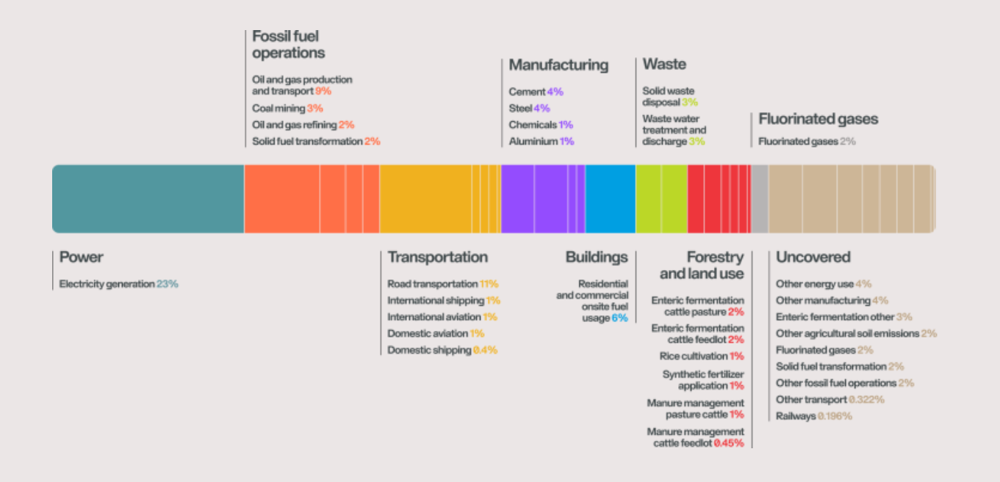

<h4> 2.2 IPCC Adaptation Report 

The IPCC Adaptation Report 2023, looks at the progress, planning and financing of the adaptation actions for mitigating climate change and its effects.


<h4> Who is it funded by? </h4> 

According to the website (https://www.ipcc.ch/documentation/procedures/#:~:text=The%20IPCC%20is%20funded%20by,member%20governments%20and%20the%20UNFCCC.) The IPCC reports are funded by the parent organisations World Meteorological Organization (WMO) and the United Nations Environment Programme (UNEP) and at times, receives voluntary contributions from its member governments and the UNFCCC. 

<h4> Why IPCC?  </h4> 

The objective of the IPCC is to provide governments at all levels with scientific information that they can use to develop climate policies. IPCC reports are also a key input into international climate change negotiations. The IPCC is an organization of governments that are members of the United Nations or WMO. The IPCC currently has 195 members. 

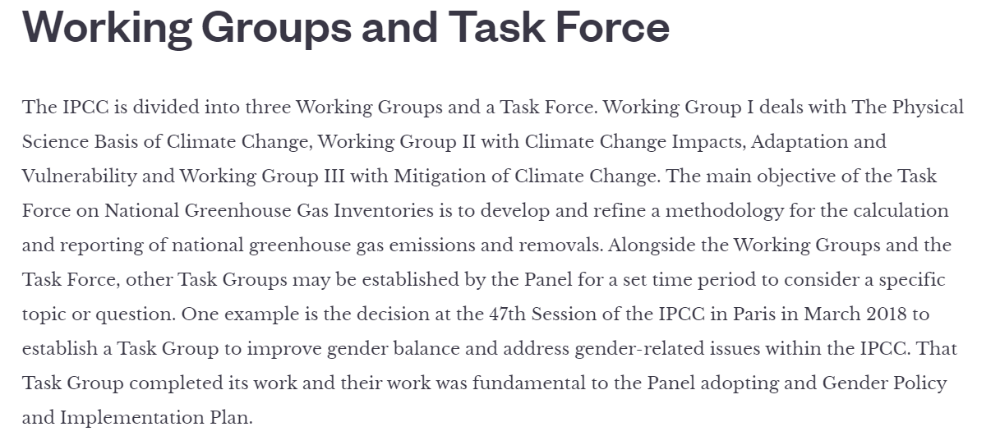

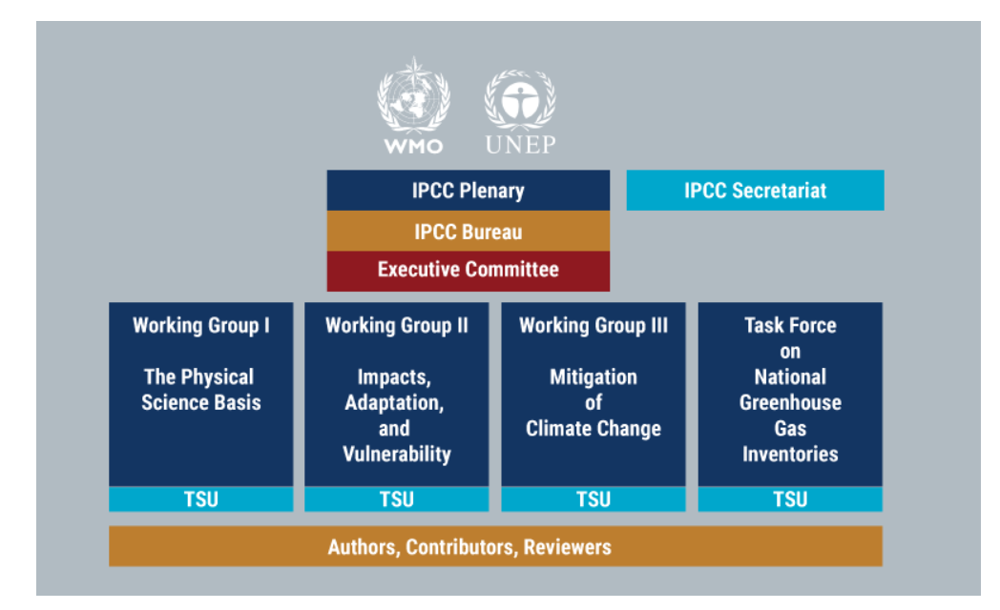

<h4> Is the information fact-checked? </h4> 

IPCC reports are developed through multiple rounds of drafting and review.As the culmination of a report’s development, IPCC member governments endorse the report. The endorsement process is based on a dialogue between those who will
use the report – the governments – and those who write it – the scientists. Endorsement by governments
acknowledges that the report is a definitive assessment that has been developed following the IPCC’s
defined procedures, underpinning the report’s authority. (https://www.ipcc.ch/site/assets/uploads/2021/07/AR6_FS_approve.pdf)

<h4> 2.3 Greenhouse gas emissions dataset - Kaggle </h4> 
https://www.kaggle.com/datasets/unitednations/international-greenhouse-gas-emissions

This Kaggle dataset renders data about emissiosn from 1990 to the latest available year, and it contains data on anthropogenic emissions by sources and removals by sinks of the following GHGs (carbon dioxide (CO2), methane (CH4), nitrous oxide (N2O), hydrofluorocarbons (HFCs), perfluorocarbons (PFCs), unspecified mix of HFCs and PFCs, sulphur hexafluoride (SF6) and nitrogen triflouride (NF3)) that are not controlled by the Montreal Protocol.

<h4> Where is the data coming from? </h4> 

According to Kaggle, this dataset was kindly published by the United Nation on the UNData site. 

<h4> How do I know if the data is fact checked? </h4> 
    
According to Kaggle, GHG emission inventories are developed by Parties to the Convention using scientific and methodological guidance from the Intergovernmental Panel on Climate Change (IPCC), such as 2006 IPCC Guidelines for National Greenhouse Gas Inventories, Revised Guidelines for National Greenhouse Gas Inventories (1996), IPCC Good Practice Guidance and Uncertainty Management in National Greenhouse Gas Inventories (2000) and IPCC Good Practice Guidance on Land Use, Land-use Change and Forestry (2003)

<h4> Who can actually use the data? </h4> 
    
According to the https://data.un.org/Host.aspx?Content=UNdataUse, UN data and metadata provided are available free of charge and may be copied freely, duplicated and further distributed provided that UN data is cited as the reference. 
    
<h4> Does this data come with any limitations? </h4> 

The data and metadata presented on UNdata are supplied as contained in the source database without any addition, subtraction, amendment, or modification by the United Nations Statistics Division.

The United Nations Statistics Division does not guarantee or make any express or implied representations regarding the accuracy, reliability, correctness, fitness for use for a particular purpose, or otherwise, whatsoever, of any of the databases in UNdata.

The United Nations Statistics Division periodically incorporates, without notice, revisions, updates and improvements to UNdata’s content according to the sources’ availability but undertakes no obligation to do so, timeously or at all.
    

<h2> 3. Metholodogy 

The data used in this report is time series: the changing temperatures dataframe contains temperatures over the years, but it also contains months and years which are used in understanding the rise and increase in temperature over the years. The greenhouse gas emissions dataframe renders all the sources of emissions in a country, as well as the year. It is important to highlight that this dataframe is fixed frequency, meaning that data points are registered at regular intervals, in this case once per month. (McKinney, 2018)
      

<h4> 3.1 Webscraping, wordclouds and testing 

For the methology of this report, I have chosen to include webscraping of several sources that look at how the population felt about the Serbian floods in 2014, as well as BBC and the Climate Change Tracker. Following the webscraping, I have: 

<ul> 
    <li> Created wordclouds for word analysis using urlpopen, BeautifulSoup, nltk and WordCloud 
        <li> Introduced error handling techniques that catch any errors that might come from webscraping 
            <li> Created unit tests that test the functionality of webscrapping using unittest. Each unit tests has 3 criteria: test to make sure the function exists, test to make sure the soup element is not empty, and a final test that makes sure the soup element contains some characters that can be scraped. 

                
                


<h4> 3.2 Exploratory Data Analysis 

Throughout this report, there will be EDA performed on the greenhouse gas emissions dataframe, that looks at cleaning the data and making sure it is displayed under a format that is easy to read and easy to use in rendering visualisations. This has been achieved by using pandas and numpy. 

The visualisations created in this report are done either with matplotlib or sns packages. Both main dataframes concerned with changing temperatures and greenhouse gas emissions have rendered visualisations that show there has been an increase in both since late 1990s or early 2000s. 

<h4> 3.3 Models 

<h4> ARIMA model </h4> 

This notebook also contains three types of models that are popular for time series forecasting dataframes. They were all applied on the changing temperature dataframe. Some EDA has been done on that dataframe in order to be able to compute the models, namely the date has been combined into one column, following the day/month/year structure. In the initial dataframe, there was no day data, so I made sure each of the entries was on the first of each month. 

The first model is the ARIMA (Auto Regressive Integrated Moving Average), which is a popular model for time series forcasting data. The model contains three components: AR (auto regressive) which makes a correlation between the current data and the previous data. The integrated component (I), which represents the difference between the time series data entries. Lastly, the MA component (moving average) looks at the relationship between the current observation and the past forecast errors. 

One of the limitations of ARIMA is that it assumes that the future is the same as the past, which can prove innacurate for countries or period of times where temperatures have a rapid increase. (https://www.investopedia.com/terms/a/autoregressive-integrated-moving-average-arima.asp#:~:text=Autoregressive%20integrated%20moving%20average%20(ARIMA)%20models%20predict%20future%20values%20based,to%20forecast%20future%20security%20prices.)

The ARIMA parameters are p, d, and q: 
<ul> 
 <li> p is represented by the number of lag observations in the model (https://www.investopedia.com/terms/a/autoregressive-integrated-moving-average-arima.asp#:~:text=Autoregressive%20integrated%20moving%20average%20(ARIMA)%20models%20predict%20future%20values%20based,to%20forecast%20future%20security%20prices.)

 <li> d is the number of times the raw observations are diferenced 
 <li> is the size of the moving average window

<ul>


<h4> AUTO-ARIMA model </h4> 

The second model is the AUTO-ARIMA, which is Auto-Regressive Integrated Moving Average, and it is also a model used in time series analysis. The difference between this model and ARIMA is that it automatically assume the optimal parameters. The model looks through different combinations of parameters and finds the best fit for the given data. It is meant to save time and computational power, unlike ARIMA. (https://www.analyticsvidhya.com/blog/2018/08/auto-arima-time-series-modeling-python-r/#h-what-is-auto-arima)


-----------------------------------------------------

<h2> Webscraping </h2> 

Below there are three webscraping scenarions, from Reddit, BBC and Climate Change Tracker. The three websites are webscraped and the summary is put into a wordcloud, in order to be able to analyse them. Each scraping function is accompanied by unit tests, that look to see if the scraping functions exist, if they soup elements are empty or not and if the soup elements contain more than 20 characters, to see if they are suitable for scraping. The scraping functions also contain a try and except in order to chatch and showcase any errors, for examples 404 or HTTP errors. 

After finding out about the dangerous floods that took place in Serbia in 2014, I wanted to look into how the population felt about the event. Reddit is a social platform where anyone can create an account and post their thoughts on various subjects. Therefore, I looked at the "worldnews" subreddit, from 2014, where people were offering (at the time) current updates on the floods, which regions were affected and any tipes and tricks for survival. The subreddit was started when a BBC article was shared, concerned with the latest updates on the flood. Throughout the subreddit, there were shared opinions, thoughts, reflections and donation inquiries for those affected by the floods. All 171 comments were summarised in a word cloud, to understand what the popular opinion was at the time. 

The second scraping is from a BBC article, created at the time of the floods, and is concerned with the (at the time) latest updates on the floods.  

The third scraping is from Climate Change Tracker, that shows the rapid increase of yearly CO2 released into the atmoshphere globally. The below representation is also taken from the Climate Change CO2 tracker. 

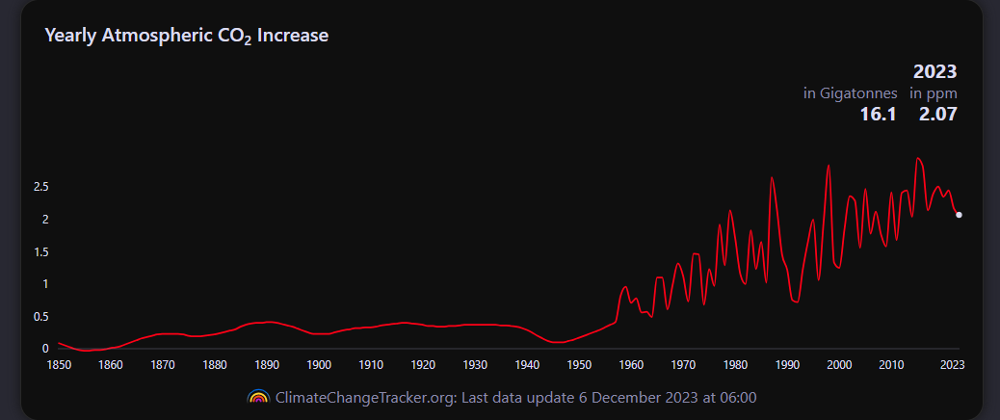

The rest of this report will look at greenhouse gas emissions in different parts of Europe, trends in temperature changes and lack of accountability.

[nltk_data] Error loading stopwords: <urlopen error [WinError 10054]
[nltk_data]     An existing connection was forcibly closed by the
[nltk_data]     remote host>


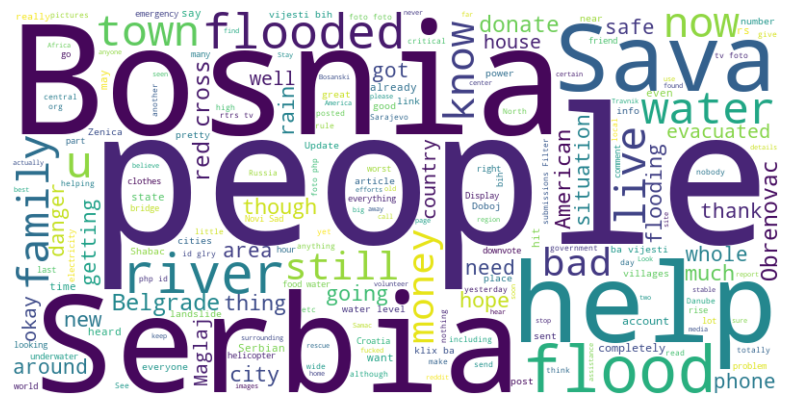

In [2]:
nltk.download('stopwords')

def scrape_reddit(url):
    try:
        response = requests.get(url)
        response.raise_for_status() 

       
        soup = BeautifulSoup(response.text, 'html.parser')

        return soup 
    except requests.exceptions.HTTPError as e:
        print(f"HTTP error occurred: {e}")
    except Exception as e:
        print(f"An error occurred: {e}")


def create_word_cloud(text):
    
    stopwords_set = set(stopwords.words('english'))
    text = ' '.join([word for word in text.split() if word.lower() not in stopwords_set])

    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()


url = 'https://old.reddit.com/r/worldnews/comments/25pcse/bosnia_and_serbia_emergency_after_worst_ever/'
soup = scrape_reddit(url)

if soup:
    container = soup.findAll("form", {'class': "usertext warn-on-unload"})
    text = ' '.join([name.get_text() for name in container])
    
    create_word_cloud(text)

In [3]:
class scrape_reddit_test(unittest.TestCase):

 
    def test_for_reddit(self):
        self.assertIsNotNone(scrape_reddit)
        print("scrape_reddit exists")

   
    def test_for_soup(self):
        self.assertIsNotNone(soup)
        print("soup is not empty")

    
    def test_soup_charcters(self):
        self.assertGreaterEqual(len(container), 20)
        print("soup has some data")

unittest.main(argv=['ignored', '-v'], exit=False)


test_for_reddit (__main__.scrape_reddit_test) ... ok
test_for_soup (__main__.scrape_reddit_test) ... ok
test_soup_charcters (__main__.scrape_reddit_test) ... ok

----------------------------------------------------------------------
Ran 3 tests in 0.009s

OK


scrape_reddit exists
soup is not empty
soup has some data


In the wordcloud extracted from Reddit, aside from the obvious words, such as "Bosnia" or "people", I identify smaller words, such as "danger", "money", "stable", "safe", "red cross", "family", "donate", "safe", and "need" showcasing that the population was quite fearful of the natural disaster that was taking place, and was generally concerned with their families that were located in both Serbia and Bosnia Herzegovina. 

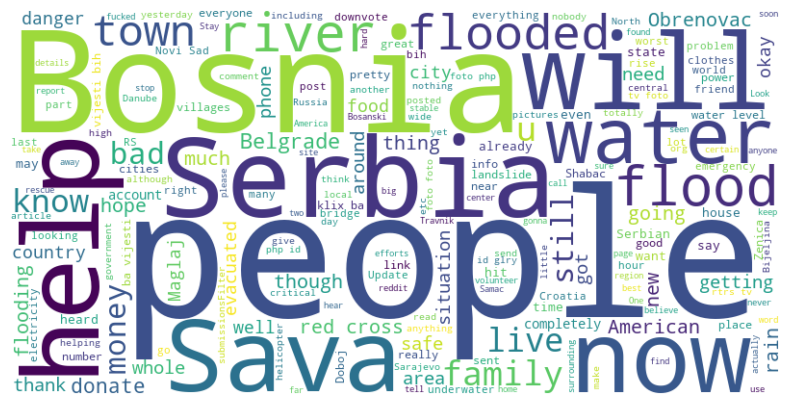

In [4]:
def scrape_bbc(url):
    try:
        response = requests.get(url)
        response.raise_for_status()  
        
     
        soup = BeautifulSoup(response.text, 'html.parser')
        
        return soup  
    except requests.exceptions.HTTPError as e:
        print(f"HTTP error occurred: {e}")
    except Exception as e:
        print(f"An error occurred: {e}")


url = 'https://www.bbc.co.uk/news/world-africa-27439139'
soup = scrape_bbc(url)


words = [name.get_text(strip=True) for name in container]


text = ' '.join(words)


wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)


plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [5]:
class scrape_bbc_test(unittest.TestCase):

    
    def test_for_bbc(self):
        self.assertIsNotNone(scrape_bbc)
        print("scrape_bbc exists")

   
    def test_for_soup_bbc(self):
        self.assertIsNotNone(soup)
        print("soup is not empty")

   
    def test_soup_text_bbc(self):
        self.assertGreaterEqual(len(text), 20)
        print("soup has some data")

unittest.main(argv=['ignored', '-v'], exit=False)

test_for_bbc (__main__.scrape_bbc_test) ... ok
test_for_soup_bbc (__main__.scrape_bbc_test) ... ok
test_soup_text_bbc (__main__.scrape_bbc_test) ... ok
test_for_reddit (__main__.scrape_reddit_test) ... ok
test_for_soup (__main__.scrape_reddit_test) ... ok
test_soup_charcters (__main__.scrape_reddit_test) ... ok

----------------------------------------------------------------------
Ran 6 tests in 0.025s

OK


scrape_bbc exists
soup is not empty
soup has some data
scrape_reddit exists
soup is not empty
soup has some data


Whilst trying to understand the public opinion on the floods, I also wanted to see what the media was saying at the time. Therefore, I have scraped a BBC article from 2014, that listed various updates and put it in a wordcloud. I identify words such as "rain", "rescue", "residents", "disaster", "helicopter", "wind", "help".

In [6]:
def create_directory(directory_name):
    if not os.path.exists(directory_name):
        os.makedirs(directory_name)


def download_image(url, save_path):
    try:
        response = requests.get(url)
        response.raise_for_status()
        with open(save_path, 'wb') as f:
            f.write(response.content)
    except requests.exceptions.HTTPError as e:
        print(f"HTTP error occurred: {e}")
    except Exception as e:
        print(f"An error occurred: {e}")


url = 'https://www.bbc.co.uk/news/world-africa-27439139'

try:
    
    response = requests.get(url)
    response.raise_for_status()  

    
    soup = BeautifulSoup(response.text, 'html.parser')

    
    img_elements = soup.find_all('img')

   
    create_directory('bbc_images')

    #saves all the images in one folder for ease of use 
    for img in img_elements:
        img_url = img.get('src')
        if img_url:
            img_name = os.path.basename(img_url)
            img_path = os.path.join('bbc_images', img_name)
            download_image(img_url, img_path)
            print(f"Downloaded: {img_name}")

    print("Images downloaded successfully.")
except requests.exceptions.HTTPError as e:
    print(f"HTTP error occurred: {e}")
except Exception as e:
    print(f"An error occurred: {e}")

Downloaded: _74898565_022257943-1.jpg
Downloaded: _74898860_022274379-1.jpg
Downloaded: _74898559_022273623-1.jpg
Downloaded: _74898567_022268348-1.jpg
Downloaded: _74898862_022274731-1.jpg
Downloaded: _74898563_022273622-1.jpg
Downloaded: _128363956_bbcm_serbia_country_profile_map_200123.png
Downloaded: _132109208_mediaitem132109207.jpg
Downloaded: _132120120_p0h10khs.jpg
Downloaded: _132103414_gettyimages-1243915436.jpg
Downloaded: _132098619_hi000521870.jpg
Downloaded: _132112484_de06.jpg
Downloaded: _131965955_newscastlogo.jpg
Downloaded: _132106508_johnson_phone_getty.jpg
Downloaded: _128216740_nhs_tracker_promo-2x-nc.png
Downloaded: _132093573_d84734b6bec43acbcc5025bad4b6dd4770a13db2.jpg
Downloaded: _131401156_thegift.jpg
Downloaded: _131966984_p0dp5syh.jpg
Downloaded: _131660312_gangster.jpg
Downloaded: _132039907_rickyandralf's.jpg
Downloaded: p0gnfc1c.jpg
Downloaded: p0gn9mf1.jpg
Downloaded: p0gsv055.jpg
Downloaded: p0gz3h51.jpg
An error occurred: [Errno 22] Invalid argument: 

you can web scrape some images from the BBC article 

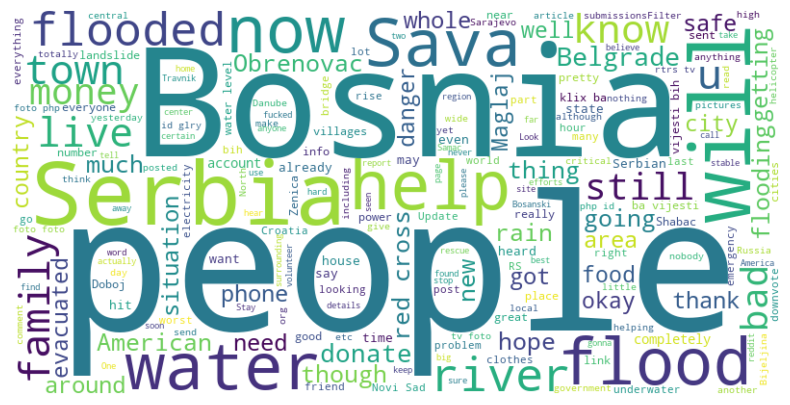

In [7]:
def scrape_climatechangetracker(url):
    try:
        response = requests.get(url)
        response.raise_for_status() 
        
        
        soup = BeautifulSoup(response.text, 'html.parser')
        
        return soup  
    except requests.exceptions.HTTPError as e:
        print(f"HTTP error occurred: {e}")
    except Exception as e:
        print(f"An error occurred: {e}")


url = 'https://climatechangetracker.org/co2/yearly-atmospheric-co2-increase'
soup = scrape_climatechangetracker(url)


words_tracker = [name.get_text(strip=True) for name in container]


text = ' '.join(words_tracker)


wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)


plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [8]:
class scrape_climatechangetracker_test(unittest.TestCase):

    
    def test_for_climatechangetracker(self):
        self.assertIsNotNone(scrape_bbc)
        print("scrape_climatechangetracker exists")

    
    def test_for_soup_climatechangetracker(self):
        self.assertIsNotNone(soup)
        print("soup is not empty")

    
    def test_soup_text_climatechangetracker(self):
        self.assertGreaterEqual(len(text), 20)
        print("soup has some data")

unittest.main(argv=['ignored', '-v'], exit=False)

test_for_bbc (__main__.scrape_bbc_test) ... ok
test_for_soup_bbc (__main__.scrape_bbc_test) ... ok
test_soup_text_bbc (__main__.scrape_bbc_test) ... ok
test_for_climatechangetracker (__main__.scrape_climatechangetracker_test) ... ok
test_for_soup_climatechangetracker (__main__.scrape_climatechangetracker_test) ... ok
test_soup_text_climatechangetracker (__main__.scrape_climatechangetracker_test) ... ok
test_for_reddit (__main__.scrape_reddit_test) ... ok
test_for_soup (__main__.scrape_reddit_test) ... ok
test_soup_charcters (__main__.scrape_reddit_test) ... ok

----------------------------------------------------------------------
Ran 9 tests in 0.020s

OK


scrape_bbc exists
soup is not empty
soup has some data
scrape_climatechangetracker exists
soup is not empty
soup has some data
scrape_reddit exists
soup is not empty
soup has some data


I identify words such as "atmospheric", "atmosphere", "increase", "CO2 increase", "Carbon Budget". 

<h4> Temperatures </h4> 

In [9]:
temp_months=pd.read_csv("temp_months.csv")
temp_months.head(20)

,Area,Months,Element,Unit,Year,Temp
0,Eastern Europe,January,Temperature_change,°C,1961,1.228
1,Eastern Europe,February,Temperature_change,°C,1961,1.722
2,Eastern Europe,March,Temperature_change,°C,1961,1.789
3,Eastern Europe,April,Temperature_change,°C,1961,0.886
4,Eastern Europe,May,Temperature_change,°C,1961,1.260
5,Eastern Europe,June,Temperature_change,°C,1961,1.045
6,Eastern Europe,July,Temperature_change,°C,1961,0.011
7,Eastern Europe,August,Temperature_change,°C,1961,-0.098
8,Eastern Europe,September,Temperature_change,°C,1961,-0.194
9,Eastern Europe,October,Temperature_change,°C,1961,-0.255


In [10]:
temp_months.shape

(1416, 6)

In [11]:
temp_months['Year'].dtype

dtype('int64')

I have a clean dataframe, so I will look at some visualisations to see if I can identify some patterns in the temperature changes of the years. Firstly, I will look at the bigger picture including all the temperatures accross all years, in both Southern and Eastern Europe. 

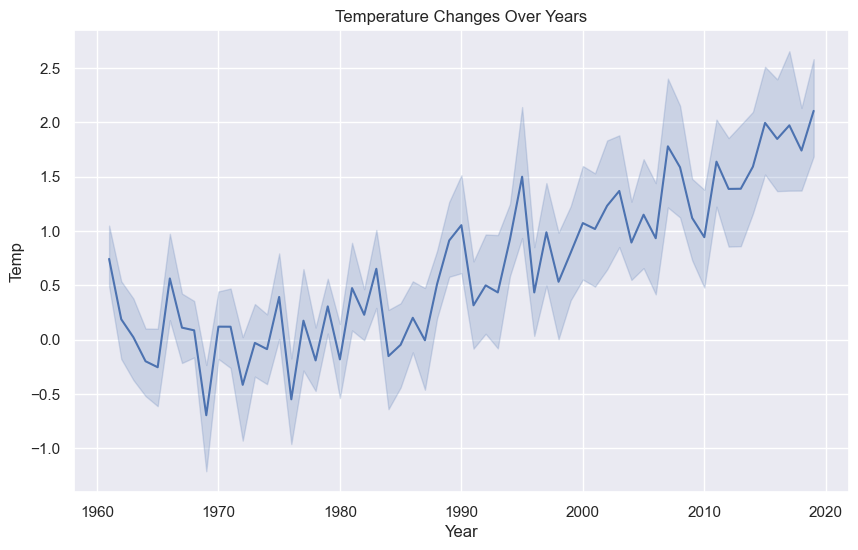

In [12]:
plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='Temp', data=temp_months)
plt.title('Temperature Changes Over Years')
plt.show()

There seems to be a fairly low change in temperature accross the years until the 1960s, when the temperature rises more and more. I will look at how the temperature changed in just one month, June, accross all years. Most likely, the increase is due to human activity. Much like entering a car left in the heat, the global population have created their own greenhouse effect, where heat is trapped and therefore affects all ecosystems. 

I will look to find more trends in the same dataframe that perhaps could explain or pinpoint what exactly caused such high increase in temperatures. 

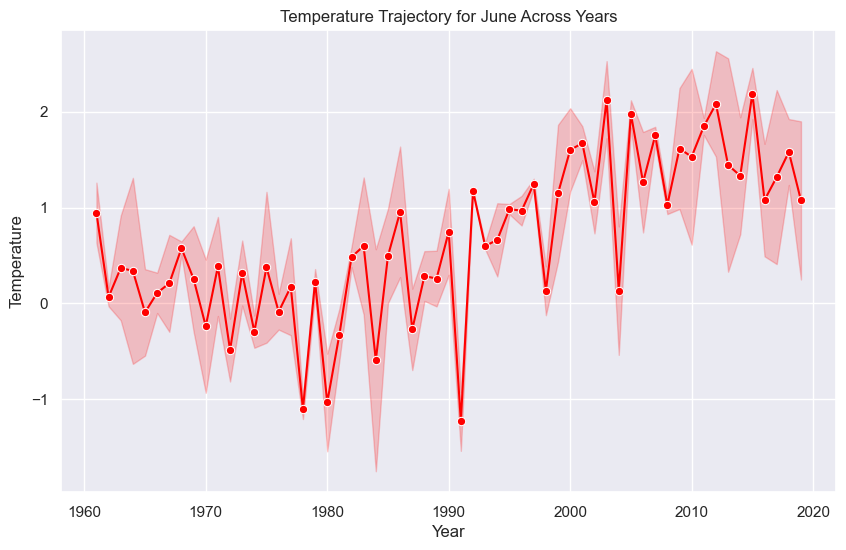

In [13]:
june_data = temp_months[temp_months['Months'] == 'May']


plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='Temp', data=june_data, marker='o', color='red')
plt.title('Temperature Trajectory for June Across Years')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.show()

The trajectory of June temperature since 1960 to 2020 has also increased since 1980, being at an all time high between 2010 and 2020. 

As mentioned before, the biggest natural disaster took place in Serbia, part of Southern Europe, so I am looking at the temperature variability in that area specifically, in June. 

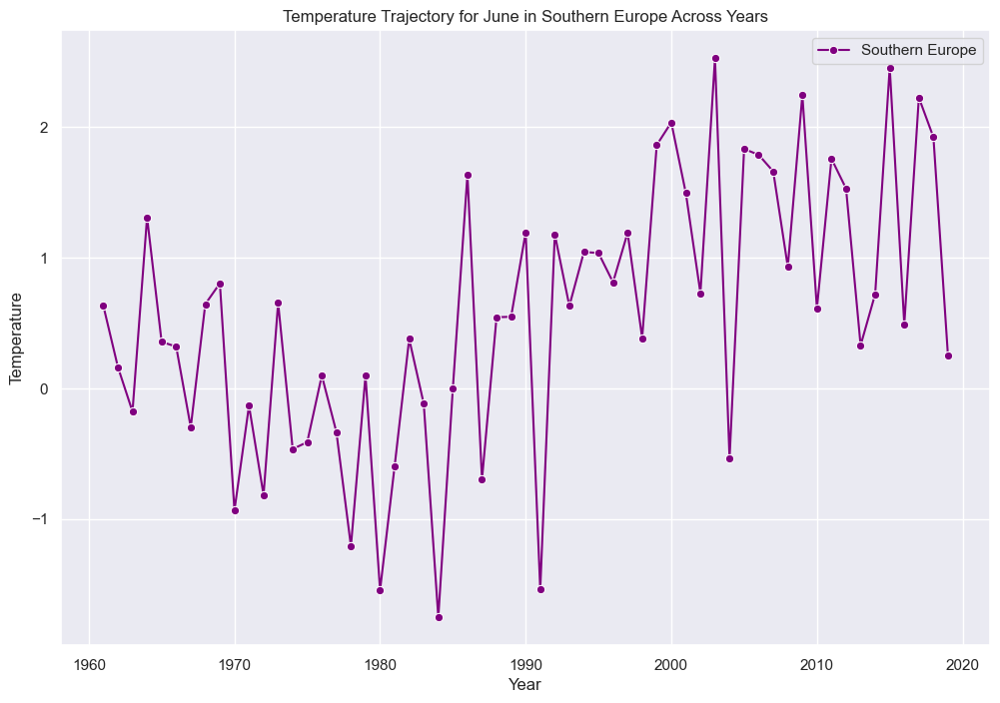

In [14]:
june_southern_europe = temp_months[(temp_months['Months'] == 'May') & (temp_months['Area'] == 'Southern Europe')]


plt.figure(figsize=(12, 8))
sns.lineplot(x='Year', y='Temp', data=june_southern_europe, marker='o', color='purple', label='Southern Europe')
plt.title('Temperature Trajectory for June in Southern Europe Across Years')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()
plt.show()

Much like the rest of Europe, Serbia has also seen a sharp increase in temperatures in June, with a fairly big change around 2005 and a constant increase after 2010. 

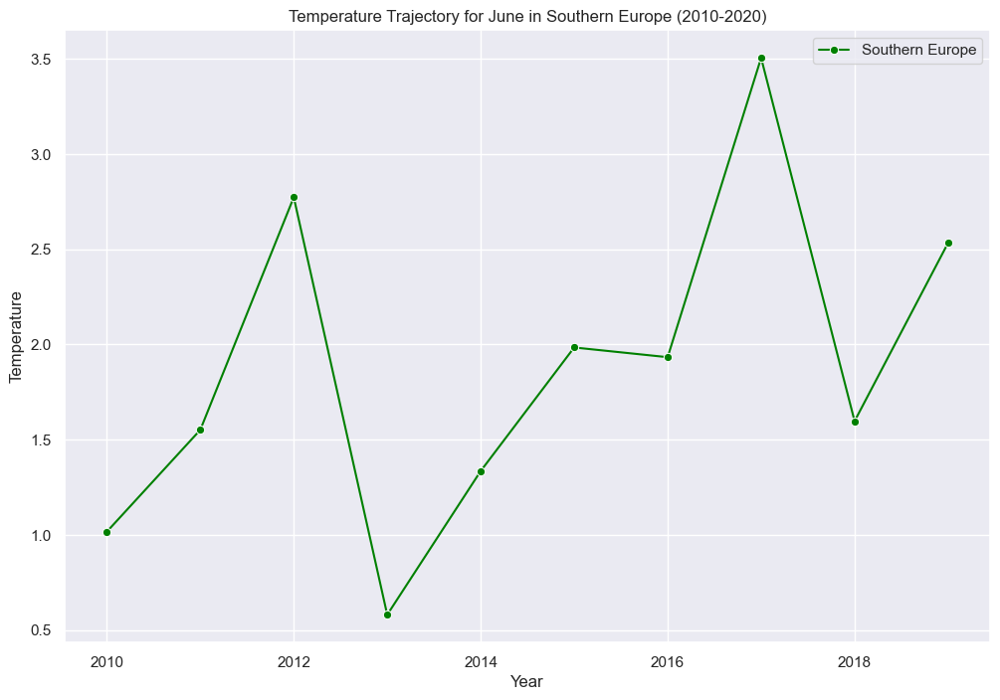

In [15]:
selected_years = [2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]
june_southern_europe_selected_years = temp_months[(temp_months['Months'] == 'June') & (temp_months['Area'] == 'Southern Europe') & (temp_months['Year'].isin(selected_years))]


plt.figure(figsize=(12, 8))
sns.lineplot(x='Year', y='Temp', data=june_southern_europe_selected_years, marker='o', color='green', label='Southern Europe')
plt.title('Temperature Trajectory for June in Southern Europe (2010-2020)')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.legend()
plt.show()

Analysing the line plot above, that shows the temperature in Southern Europe between 2010 and 2020, it seems there was a drop in 2013 but another sharp increase in 2014. This is most likely due to the different levels of human activity that contribute to the greenhouse gas emissions. 

The below sections will look at what caused this flood to take place, but also the wider context of the situation. 

<h4> What led to the floods? </h4> 

According to ReliefWeb (2014), "Serbia was faced with the worst floods due to the heaviest rains seen in the region for more than a century. Heavy rainfall began on 13 May, as a result of a low-pressure area (Yvette internationally, Tamara in the Balkans) that formed over the Adriatic Sea due to polar air from Central Europe meeting with the humid subtropical air of the Mediterranean basin".


<h4> Who was impacted? </h4> 
With 33 fatalities, 32000 people displaced and 773 still missing in June 2014, an average of 6000 children were housed in temporary accomodation. The findings show that large number of families were Roma from informal settlements, who lost their homes during the flood. At the time, no one knew when they would be able to be housed again, but the projections showed that vulnerable families would take up to 3 months to find a new home. (2014)

Over 2260 buildings have been flooded and 1800 seriously damaged. The affected houses also lost any agriculture production, meaning that the flood took away the opportunity for people to feed themselves or trade products. (2014)

All affected areas have had their water and sanitation flooded but thankfully, no health outbrakes took place or have been recorded. (2014)

The striking reality is that floods affect those who are already living in poverty, in mobile homes or on the streets. The Ministry of Labour in Serbia has reported that 110000 people that were part of the social welfare have been affected and required immediate assistance. (2014)

Sadly, the Serbian floods of 2014 did not only highlighted the natural imbalance caused by industrial activity, but also the population imbalance where most of those who do not benefit financially from mass production are suffering the most. 

According to Marcus Lu (2023), those suffering the most from natural disasters caused by greenhouse gas emissions, are also the bottom 50% that are responsible for only 8% of the emissions. 

It seems that wealthier families contribute more to CO1 emissions, and yet they are not the ones suffering the consequences. The reason for that is disparity in consumption. Visual Capitalist alongside the Stockholm Environment Institute, report that the fashion industry produces between 2& and 8% of the global emissions. The same applies to the transport sector, which have more than doubled since 1970. Higher income families spend more on food as well, which involves production, transport and handling food that generates more CO2 emissions. Additionally, food waste generates methane. 





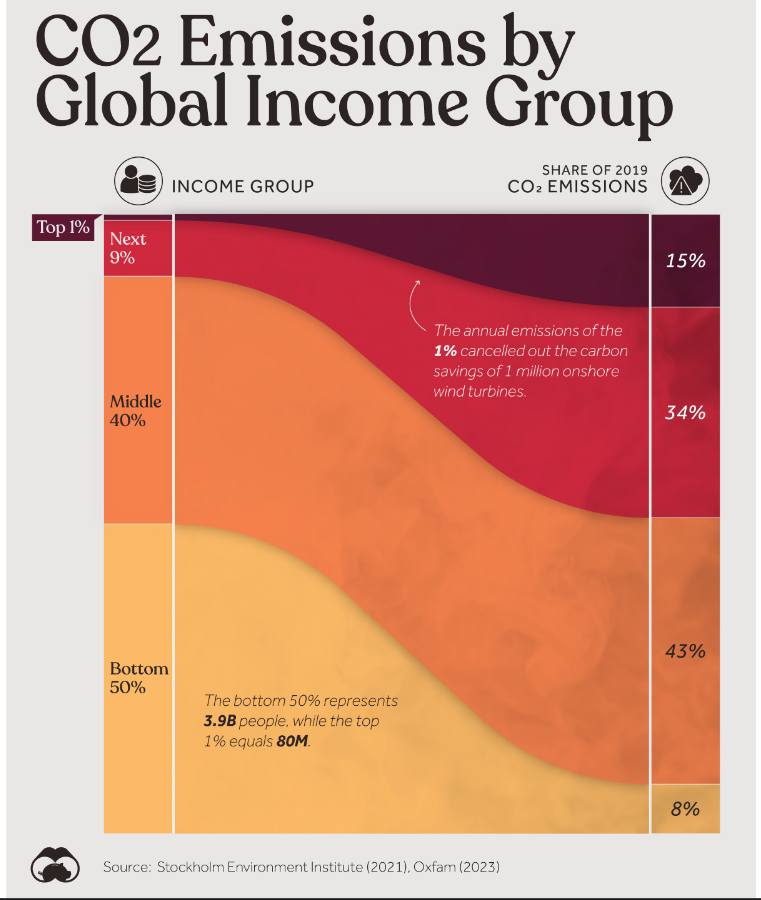

-------------------------------------------------

<h3> Greehouse gas emissions in Serbia

According to the visualisations done previously, 2014 was at the start of a rapid increase in temperature, likely caused by an increase in greenhouse gas emissions. The latter contributed to warm air which results in heavy rains. This might be an explanation of the floods that took place in Serbia and Bosnia, however it does not cover the entire truth. I am now going to look at the GHG emissions in those years, in Serbia, trying to uncover what caused the increase in CO2. 
    
I am pulling in a new dataframe, that looks at the GHG emissions in Serbia during the same timeline.It is combined from various types of sources of emissions, but ultimately the IndicatorName column will be reduced to CO2. 

In [16]:
ghg_serbia=pd.read_csv("ghg_serbia.csv")
ghg_serbia.head(20)

,Country Name,Country ISO3,Year,Indicator Name,Indicator Code,Value
0,Serbia,SRB,2015,Urban population living in areas where elevati...,EN.POP.EL5M.UR.ZS,0
1,Serbia,SRB,2000,Urban population living in areas where elevati...,EN.POP.EL5M.UR.ZS,0
2,Serbia,SRB,1990,Urban population living in areas where elevati...,EN.POP.EL5M.UR.ZS,0
3,Serbia,SRB,2022,Urban population growth (annual %),SP.URB.GROW,-0.701109013
4,Serbia,SRB,2021,Urban population growth (annual %),SP.URB.GROW,-0.58117636
5,Serbia,SRB,2020,Urban population growth (annual %),SP.URB.GROW,-0.336030935
6,Serbia,SRB,2019,Urban population growth (annual %),SP.URB.GROW,-0.237549081
7,Serbia,SRB,2018,Urban population growth (annual %),SP.URB.GROW,-0.278572237
8,Serbia,SRB,2017,Urban population growth (annual %),SP.URB.GROW,-0.295976068
9,Serbia,SRB,2016,Urban population growth (annual %),SP.URB.GROW,-0.319220861


This dataframe is quite extensive, and it shows a lot of information, that although it is interesting, it is not needed for the analysis at hand. I will perform some EDA in order to drop it several columns and rows, until we can obtain a clean dataframe that only shows information about the GHG emissions in Serbia. 

In [17]:
ghg_serbia.rename(columns={'Year': 'Year', 'Indicator Name': 'Indicator', 'Value': 'Value'}, inplace=True)
ghg_serbia.head()

,Country Name,Country ISO3,Year,Indicator,Indicator Code,Value
0,Serbia,SRB,2015,Urban population living in areas where elevati...,EN.POP.EL5M.UR.ZS,0
1,Serbia,SRB,2000,Urban population living in areas where elevati...,EN.POP.EL5M.UR.ZS,0
2,Serbia,SRB,1990,Urban population living in areas where elevati...,EN.POP.EL5M.UR.ZS,0
3,Serbia,SRB,2022,Urban population growth (annual %),SP.URB.GROW,-0.701109013
4,Serbia,SRB,2021,Urban population growth (annual %),SP.URB.GROW,-0.58117636


In [18]:
print(ghg_serbia.columns)

Index(['Country Name', 'Country ISO3', 'Year', 'Indicator', 'Indicator Code',
       'Value'],
      dtype='object')


In [19]:
ghg_serbia.drop(ghg_serbia.index[0], inplace=True)
ghg_serbia

,Country Name,Country ISO3,Year,Indicator,Indicator Code,Value
1,Serbia,SRB,2000,Urban population living in areas where elevati...,EN.POP.EL5M.UR.ZS,0
2,Serbia,SRB,1990,Urban population living in areas where elevati...,EN.POP.EL5M.UR.ZS,0
3,Serbia,SRB,2022,Urban population growth (annual %),SP.URB.GROW,-0.701109013
4,Serbia,SRB,2021,Urban population growth (annual %),SP.URB.GROW,-0.58117636
5,Serbia,SRB,2020,Urban population growth (annual %),SP.URB.GROW,-0.336030935
...,...,...,...,...,...,...
1181,Serbia,SRB,1993,Access to electricity (% of population),EG.ELC.ACCS.ZS,100
1182,Serbia,SRB,1992,Access to electricity (% of population),EG.ELC.ACCS.ZS,100
1183,Serbia,SRB,1991,Access to electricity (% of population),EG.ELC.ACCS.ZS,100
1184,Serbia,SRB,1990,Access to electricity (% of population),EG.ELC.ACCS.ZS,100


In [20]:
columns_drop = ["Country Name", "Country ISO3", "Indicator Code"]
ghg_serbia.drop(columns=columns_drop, inplace=True)
ghg_serbia

,Year,Indicator,Value
1,2000,Urban population living in areas where elevati...,0
2,1990,Urban population living in areas where elevati...,0
3,2022,Urban population growth (annual %),-0.701109013
4,2021,Urban population growth (annual %),-0.58117636
5,2020,Urban population growth (annual %),-0.336030935
...,...,...,...
1181,1993,Access to electricity (% of population),100
1182,1992,Access to electricity (% of population),100
1183,1991,Access to electricity (% of population),100
1184,1990,Access to electricity (% of population),100


I am now going to go through a series of filters and processing in order to drop the rows that I will not be needing for the analysis. I will create a co2_serbia dataframe that only contains the "CO2 emissions (kt)" value. I will be adding another column called "Unit" that will contain all the kt units, for better readability. 

In [21]:
unique_values = ghg_serbia['Indicator'].unique()
print(unique_values)

['Urban population living in areas where elevation is below 5 meters (% of total population)'
 'Urban population growth (annual %)'
 'Urban population (% of total population)' 'Urban population'
 'Urban land area where elevation is below 5 meters (sq. km)'
 'Urban land area where elevation is below 5 meters (% of total land area)'
 'Total greenhouse gas emissions (kt of CO2 equivalent)'
 'Terrestrial protected areas (% of total land area)'
 'Terrestrial and marine protected areas (% of total territorial area)'
 'SF6 gas emissions (thousand metric tons of CO2 equivalent)'
 'School enrollment, primary and secondary (gross), gender parity index (GPI)'
 'Rural population living in areas where elevation is below 5 meters (% of total population)'
 'Rural land area where elevation is below 5 meters (sq. km)'
 'Rural land area where elevation is below 5 meters (% of total land area)'
 'Renewable energy consumption (% of total final energy consumption)'
 'Primary completion rate, total (% of re

In [22]:
co2_serbia = ghg_serbia[ghg_serbia['Indicator'].isin([
    "CO2 emissions (kt)",
    "CO2 emissions from solid fuel consumption (kt)",
    "CO2 emissions from liquid fuel consumption (kt)",
    "CO2 emissions from gaseous fuel consumption (kt)"
])]
co2_serbia.reset_index(drop=True, inplace=True)

In [23]:
co2_serbia['Unit'] = 'Kt'
co2_serbia

C:\Users\nicol\AppData\Local\Temp\ipykernel_66672\3317024304.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  co2_serbia['Unit'] = 'Kt'


,Year,Indicator,Value,Unit
0,2016,CO2 emissions from solid fuel consumption (kt),31092.493,Kt
1,2015,CO2 emissions from solid fuel consumption (kt),30593.781,Kt
2,2014,CO2 emissions from solid fuel consumption (kt),24645.907,Kt
3,2013,CO2 emissions from solid fuel consumption (kt),31312.513,Kt
4,2012,CO2 emissions from solid fuel consumption (kt),30139.073,Kt
...,...,...,...,...
59,1994,CO2 emissions (kt),39618.2,Kt
60,1993,CO2 emissions (kt),43190.6,Kt
61,1992,CO2 emissions (kt),48858.2,Kt
62,1991,CO2 emissions (kt),52202.4,Kt


In [24]:
co2_serbia['Indicator'] = co2_serbia['Indicator'].replace({'CO2 emissions (kt)': 'CO2 emissions'})
co2_serbia['Indicator'] = co2_serbia['Indicator'].replace({'CO2 emissions from solid fuel consumption (kt)': 'CO2 emissions'})
co2_serbia['Indicator'] = co2_serbia['Indicator'].replace({'CO2 emissions from liquid fuel consumption (kt)'})
co2_serbia['Indicator'] = co2_serbia['Indicator'].replace({'CO2 emissions from gaseous fuel consumption (kt)': 'CO2 emissions'})

C:\Users\nicol\AppData\Local\Temp\ipykernel_66672\232214439.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  co2_serbia['Indicator'] = co2_serbia['Indicator'].replace({'CO2 emissions (kt)': 'CO2 emissions'})
C:\Users\nicol\AppData\Local\Temp\ipykernel_66672\232214439.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  co2_serbia['Indicator'] = co2_serbia['Indicator'].replace({'CO2 emissions from solid fuel consumption (kt)': 'CO2 emissions'})
C:\Users\nicol\AppData\Local\Temp\ipykernel_66672\232214439.py

In [25]:
co2_serbia.shape

(64, 4)

In [26]:
co2_serbia = co2_serbia.sort_values(by=['Value'])
co2_serbia = co2_serbia.sort_values(by=['Year'])
co2_serbia

,Year,Indicator,Value,Unit
63,1990,CO2 emissions,61906.5,Kt
62,1991,CO2 emissions,52202.4,Kt
61,1992,CO2 emissions,48858.2,Kt
60,1993,CO2 emissions,43190.6,Kt
59,1994,CO2 emissions,39618.2,Kt
...,...,...,...,...
37,2016,CO2 emissions,46635,Kt
36,2017,CO2 emissions,47342.6,Kt
35,2018,CO2 emissions,46192.4,Kt
34,2019,CO2 emissions,46030.1,Kt


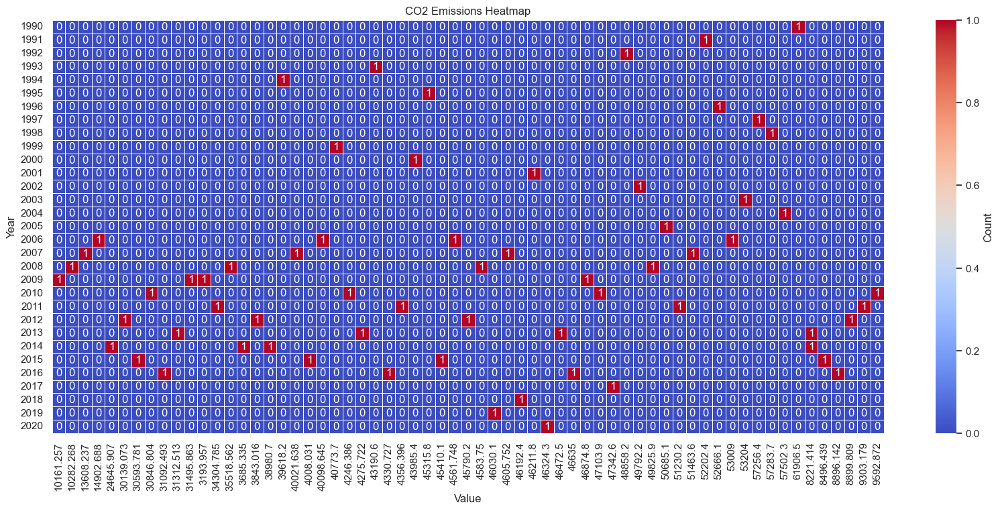

In [27]:
co2_heatmap = pd.DataFrame(co2_serbia)


heatmap_data = co2_heatmap.pivot_table(index='Year', columns='Value', aggfunc='size', fill_value=0)


plt.figure(figsize=(20, 8))
sns.set_theme() 

sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt='g', linewidths=.5, cbar_kws={'label': 'Count'})
plt.title('CO2 Emissions Heatmap')
plt.show()

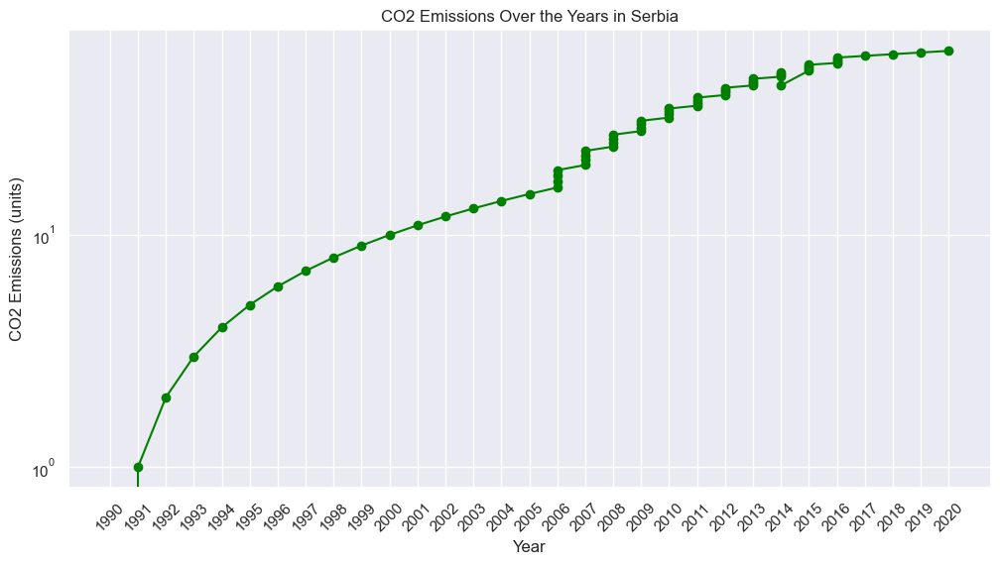

In [28]:
plt.figure(figsize=(12, 6))
plt.plot(co2_serbia['Year'], co2_serbia['Value'], marker='o', linestyle='-', color='green')
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.title('CO2 Emissions Over the Years in Serbia')
plt.xlabel('Year')
plt.ylabel('CO2 Emissions (units)')
plt.xticks(rotation=45)  # Rotate x-axis labels
plt.grid(True)
plt.show()

It seems that over the years, Serbia has increased the number of greenhouse gas emissionsm more precisley C02, released into the atmosphere. In 2006 there was a sharp incline that has continued to 2020 and presumably to the present time. 

According to the "Second National Communication of the Republic of Serbia under the United Nations Framework Convention on Climate Change", released in 2017, Serbia has had 67,148.23 Gg CO2 eq. (Second National Communication of the Republic of Serbia under the United Nations Framework Convention on Climate Change, 2017)

In 2014, Serbia has had an increase of 2.4% compared to 2000. It seems the biggest culprit is the energy sector with over 80% of the total emissions, followed closely by the agriculture forestry and land use.  
    

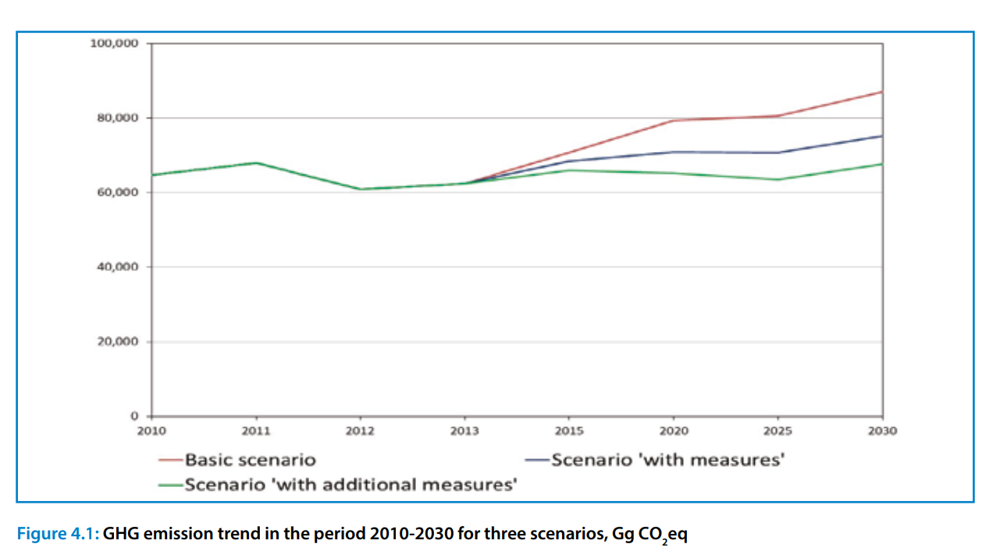

The above picture shows three scenarions: basic, with measures, with additional measures. It is highlighted that the basic scenario, i.e. as it currently stands, is the worst, resulting in an increase in GHG emissions by 14.37% in 2030. Opposite of it, is the "with additional measures" scenario, that illustrates a decrease GHG emissions by 23.50%. (Second National Communication of the Republic of Serbia under the United Nations Framework Convention on Climate Change, 2017)
    
The report continues to highlight that eight out of ten hottest years recorded were observed after 2000, and this came with irregularities in the precipitation trends. Some areas were more favoured by rainfall then others and at times it was more intense than usual. 
    
The report validates the above visualisations, critiquing that the "most remarkable changes were observed in the temperature rise trends, coupled with extreme high temperatures and extended warm periods". 
    
An incredibly interesting yet terrifying aspect, is that the record is leading to the idea that "by the end of the century, the number of frost days will have reduced to the level when it can be considered a rare event", with the number of summer days increasing by 20 to 30 days. 

<h2> Coal mining, oil and power plants affecting rising temperature changes

Interestingly enough, the Internationl Energy Agency is showing the number one culprit for Serbian energy sector is the coal, followed by oil. In the right lower corner, if you squint your eyes, you will be able to see the wind and solar energy use, that seems to have started sometime around 2017. 

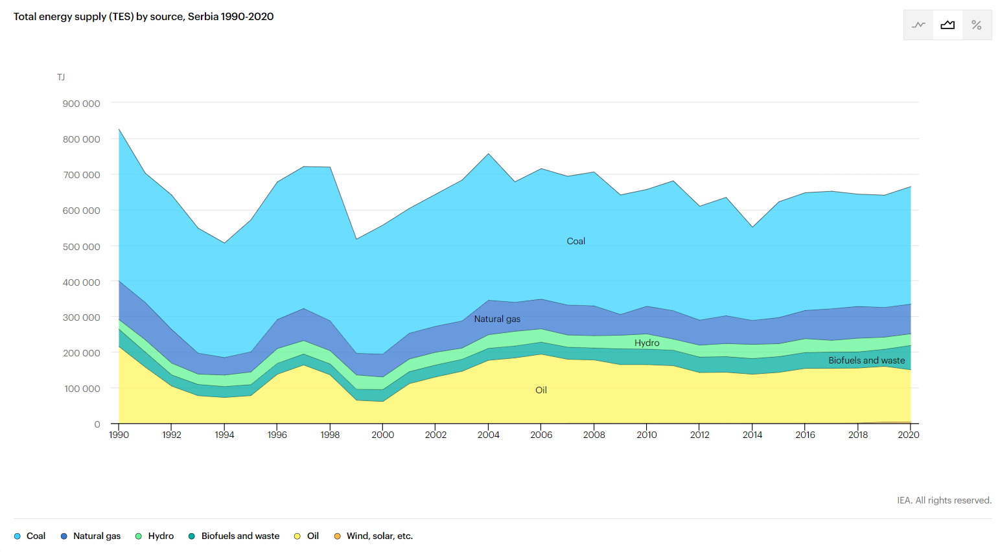

I am interested in knowing more about the Serbian energy sector, who is it dominated by and why the wind and solar energy is so incredibly low. At this point in time, I want to highlight that according to macrotrends.net, 72.43% of the Serbian population was using electricity sources from coal in 2014.
    
    
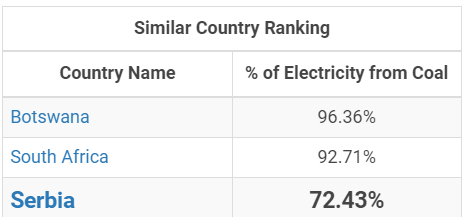

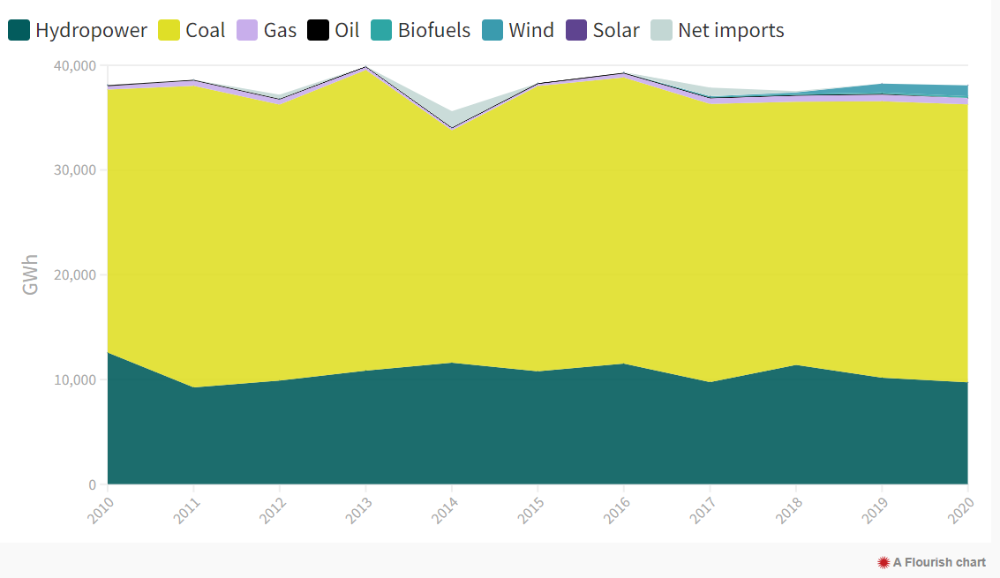

According to BankWatch (2023), the enery Serbian market is dominated by the state-owned power utility EPS (Elektroprivreda Srbije – Power Industry of Serbia). Serbia's coal reserves are owned and operated by subsidiaries of EPS. It seems despite the increasing temperature changes sourced from emitting too many greenhouse gas emissions, no new large hydropower plants have been built for several years, even though they are planned. BankWatch is highlighting that even though it has been proven that greenhouse gas emissions increase temperature, change rain patterns and leads to natural disasters, putting lives and infrastructure at risk, it seems the coal burning industry has no plan to stop. 

Even though EPS continues to burn coal, several mines that located in Serbia have been suffering multiple issues stemmed from climate change. BankWatch (2023) illustrates that "in May 2014 the Kolubara mines were turned into polluted lakes. Each of the four mines was flooded, two of them completely. In the biggest open-pit mine, Tamnava West, ten huge excavators used for mining were flooded, and six of them completely underwater. The Drmno mine also suffered serious flooding in 2014. During the May floods a heroic effort was mounted to save the mine, but between July and September of the same year more than 2 million cubic metres of water spilled into the mine, bringing with it around 800 000 cubic metres of sludge and mud, that engulfed mining machinery."

In this section, I looked at the greenhouse gas emissions stemming from Serbia's energy industry. I found that most of the GHG emissions in the country are related to burning coal with CO2 emissions increasing year by year, despite the also increasing climate change repercursions on the power plants, mines and larger population. I am curious to see which of the European countries also have increases levels of greenhouse gas emissions that can contribute to the increase in natural disasters. 

<h4> Power Plants in Europe </h4> 

Thw snippet below taken from Climate Trace's satellite data, shows the amount of power plants that are still releasing greenhouse gas emissions into the atmoshpere. It shows that South Europe is dominated by active power plants, that damage the quality of life of the European population but also that debalance nature and leads to natural disasters. 

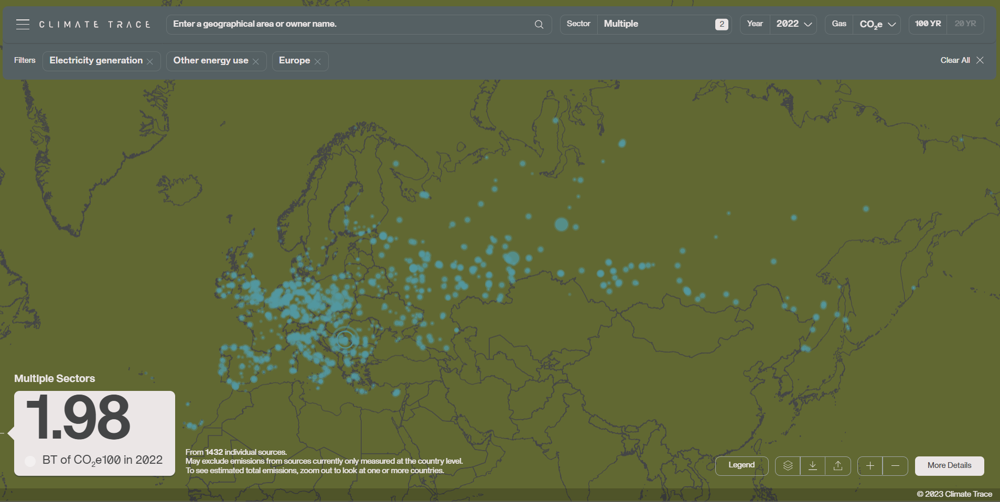

I will be looking at two of Serbia's neighbours, Czech Republic and Romania, to see if there are any similarities in GHG emissions. 

-------------------------

<h2> European teamwork

Serbia is not the only country that causes such a natural imbalance - many of the European countries releasing the same or even higher levels or greenhouse gas emissions. In the section below I will be introducing two new dataframes, one concerned with GHG emissions releases by Czech Republic and Romania. The aim of the visualisations below is to showcase how many greenhouse gas emissions are the two countries releasing, and how that contributes to the emissions releases by Serbia. 

<h3> Czech Republic 

In [29]:
gng_cr=pd.read_csv("gng_cr.csv")
gng_cr

,Country Name,Year,Value,Source
0,Czech Republic,2014,101159.122200,carbon_dioxide_co2_emissions_without_land_use_...
1,Czech Republic,2013,106477.088700,carbon_dioxide_co2_emissions_without_land_use_...
2,Czech Republic,2012,109841.328900,carbon_dioxide_co2_emissions_without_land_use_...
3,Czech Republic,2011,114113.146700,carbon_dioxide_co2_emissions_without_land_use_...
4,Czech Republic,2010,115757.368600,carbon_dioxide_co2_emissions_without_land_use_...
...,...,...,...,...
188,Czech Republic,1994,88.639762,sulphur_hexafluoride_sf6_emissions_in_kilotonn...
189,Czech Republic,1993,87.549619,sulphur_hexafluoride_sf6_emissions_in_kilotonn...
190,Czech Republic,1992,86.354180,sulphur_hexafluoride_sf6_emissions_in_kilotonn...
191,Czech Republic,1991,85.049512,sulphur_hexafluoride_sf6_emissions_in_kilotonn...


In [30]:
print(gng_cr.columns)

Index(['Country Name ', 'Year', 'Value', 'Source'], dtype='object')


In [31]:
gng_cr.drop(gng_cr.index[0], inplace=True)
gng_cr

,Country Name,Year,Value,Source
1,Czech Republic,2013,106477.088700,carbon_dioxide_co2_emissions_without_land_use_...
2,Czech Republic,2012,109841.328900,carbon_dioxide_co2_emissions_without_land_use_...
3,Czech Republic,2011,114113.146700,carbon_dioxide_co2_emissions_without_land_use_...
4,Czech Republic,2010,115757.368600,carbon_dioxide_co2_emissions_without_land_use_...
5,Czech Republic,2009,113970.029200,carbon_dioxide_co2_emissions_without_land_use_...
...,...,...,...,...
188,Czech Republic,1994,88.639762,sulphur_hexafluoride_sf6_emissions_in_kilotonn...
189,Czech Republic,1993,87.549619,sulphur_hexafluoride_sf6_emissions_in_kilotonn...
190,Czech Republic,1992,86.354180,sulphur_hexafluoride_sf6_emissions_in_kilotonn...
191,Czech Republic,1991,85.049512,sulphur_hexafluoride_sf6_emissions_in_kilotonn...


In [32]:
unique_values_cr = gng_cr["Source"].unique()
print(unique_values_cr)

['carbon_dioxide_co2_emissions_without_land_use_land_use_change_and_forestry_lulucf_in_kilotonne_co2_equivalent'
 'greenhouse_gas_ghgs_emissions_including_indirect_co2_without_lulucf_in_kilotonne_co2_equivalent'
 'greenhouse_gas_ghgs_emissions_without_land_use_land_use_change_and_forestry_lulucf_in_kilotonne_co2_equivalent'
 'hydrofluorocarbons_hfcs_emissions_in_kilotonne_co2_equivalent'
 'methane_ch4_emissions_without_land_use_land_use_change_and_forestry_lulucf_in_kilotonne_co2_equivalent'
 'nitrogen_trifluoride_nf3_emissions_in_kilotonne_co2_equivalent'
 'nitrous_oxide_n2o_emissions_without_land_use_land_use_change_and_forestry_lulucf_in_kilotonne_co2_equivalent'
 'perfluorocarbons_pfcs_emissions_in_kilotonne_co2_equivalent'
 'sulphur_hexafluoride_sf6_emissions_in_kilotonne_co2_equivalent']


In [33]:
gng_cr.drop(columns=['Source'], inplace=True)
gng_cr

,Country Name,Year,Value
1,Czech Republic,2013,106477.088700
2,Czech Republic,2012,109841.328900
3,Czech Republic,2011,114113.146700
4,Czech Republic,2010,115757.368600
5,Czech Republic,2009,113970.029200
...,...,...,...
188,Czech Republic,1994,88.639762
189,Czech Republic,1993,87.549619
190,Czech Republic,1992,86.354180
191,Czech Republic,1991,85.049512


In [34]:
gng_cr['Unit'] = 'kt'
gng_cr

,Country Name,Year,Value,Unit
1,Czech Republic,2013,106477.088700,kt
2,Czech Republic,2012,109841.328900,kt
3,Czech Republic,2011,114113.146700,kt
4,Czech Republic,2010,115757.368600,kt
5,Czech Republic,2009,113970.029200,kt
...,...,...,...,...
188,Czech Republic,1994,88.639762,kt
189,Czech Republic,1993,87.549619,kt
190,Czech Republic,1992,86.354180,kt
191,Czech Republic,1991,85.049512,kt


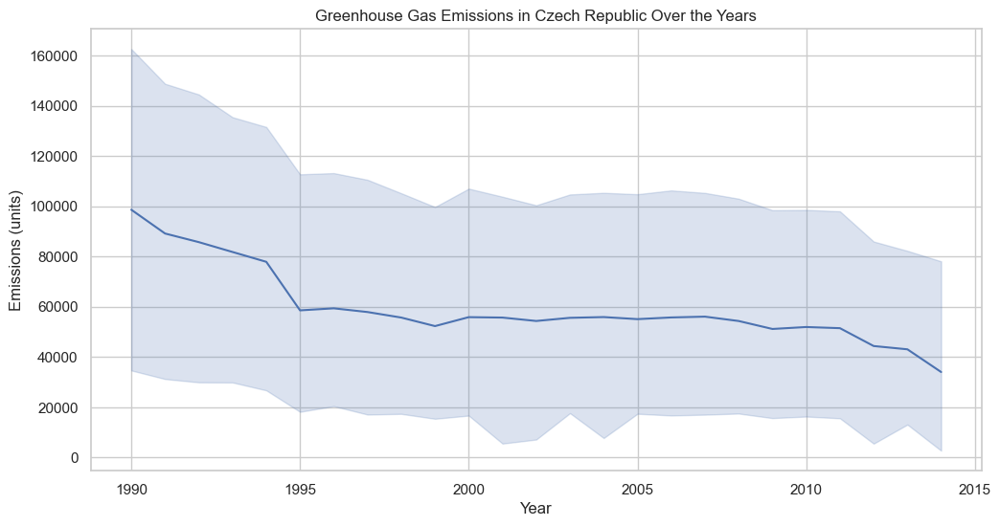

In [35]:
sns.set_style("whitegrid")

plt.figure(figsize=(12, 6))
sns.lineplot(x='Year', y='Value', data=gng_cr)

plt.title('Greenhouse Gas Emissions in Czech Republic Over the Years')
plt.xlabel('Year')
plt.ylabel('Emissions (units)')

plt.show()

Czech Republic is one of the European countries that releases quite a lot of GHG emissions as well. According to Climate Trace, the country is responsible for 47.71 MT of CO2e100 in 2022, just for the power industry. 

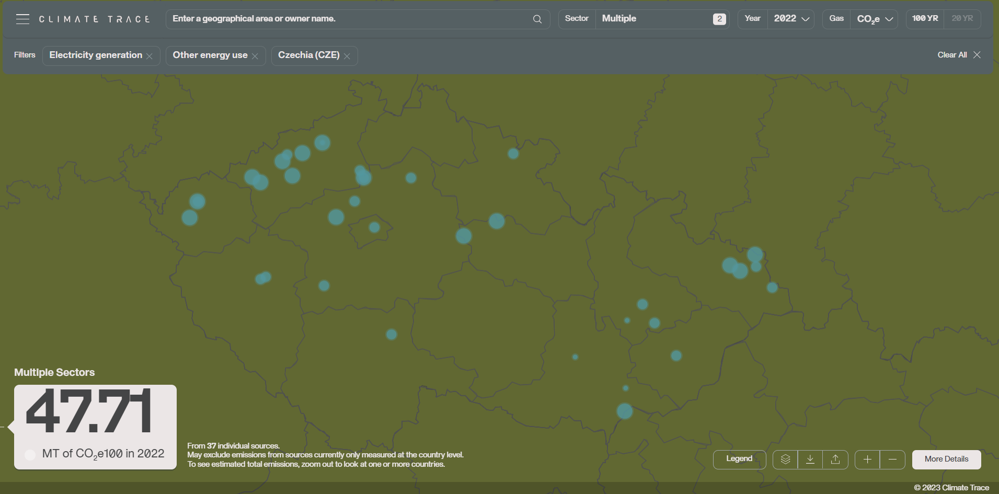

The above picture shows all the Czech power plants that are active to this day. 

<h3> Romania 


In [36]:
ghg_romania=pd.read_csv("ghg_romania.csv")
ghg_romania

,country_or_area,year,value,category
0,Romania,1990,174731.886800,carbon_dioxide_co2_emissions_without_land_use_...
1,Romania,1990,254999.122900,greenhouse_gas_ghgs_emissions_including_indire...
2,Romania,1990,254999.122900,greenhouse_gas_ghgs_emissions_without_land_use...
3,Romania,1990,0.181193,hydrofluorocarbons_hfcs_emissions_in_kilotonne...
4,Romania,1990,62314.756740,methane_ch4_emissions_without_land_use_land_us...
...,...,...,...,...
195,Romania,2014,1373.276196,hydrofluorocarbons_hfcs_emissions_in_kilotonne...
196,Romania,2014,29101.498840,methane_ch4_emissions_without_land_use_land_us...
197,Romania,2014,7033.441874,nitrous_oxide_n2o_emissions_without_land_use_l...
198,Romania,2014,6.344900,perfluorocarbons_pfcs_emissions_in_kilotonne_c...


In [37]:
ghg_romania.drop(ghg_romania.index[0], inplace=True)
ghg_romania

,country_or_area,year,value,category
1,Romania,1990,254999.122900,greenhouse_gas_ghgs_emissions_including_indire...
2,Romania,1990,254999.122900,greenhouse_gas_ghgs_emissions_without_land_use...
3,Romania,1990,0.181193,hydrofluorocarbons_hfcs_emissions_in_kilotonne...
4,Romania,1990,62314.756740,methane_ch4_emissions_without_land_use_land_us...
5,Romania,1990,15496.656790,nitrous_oxide_n2o_emissions_without_land_use_l...
...,...,...,...,...
195,Romania,2014,1373.276196,hydrofluorocarbons_hfcs_emissions_in_kilotonne...
196,Romania,2014,29101.498840,methane_ch4_emissions_without_land_use_land_us...
197,Romania,2014,7033.441874,nitrous_oxide_n2o_emissions_without_land_use_l...
198,Romania,2014,6.344900,perfluorocarbons_pfcs_emissions_in_kilotonne_c...


In [38]:
unique_values_romania = ghg_romania["category"].unique()
print(unique_values_romania)

['greenhouse_gas_ghgs_emissions_including_indirect_co2_without_lulucf_in_kilotonne_co2_equivalent'
 'greenhouse_gas_ghgs_emissions_without_land_use_land_use_change_and_forestry_lulucf_in_kilotonne_co2_equivalent'
 'hydrofluorocarbons_hfcs_emissions_in_kilotonne_co2_equivalent'
 'methane_ch4_emissions_without_land_use_land_use_change_and_forestry_lulucf_in_kilotonne_co2_equivalent'
 'nitrous_oxide_n2o_emissions_without_land_use_land_use_change_and_forestry_lulucf_in_kilotonne_co2_equivalent'
 'perfluorocarbons_pfcs_emissions_in_kilotonne_co2_equivalent'
 'sulphur_hexafluoride_sf6_emissions_in_kilotonne_co2_equivalent'
 'carbon_dioxide_co2_emissions_without_land_use_land_use_change_and_forestry_lulucf_in_kilotonne_co2_equivalent']


In [39]:
ghg_romania.drop(columns=['category'], inplace=True)
ghg_romania

,country_or_area,year,value
1,Romania,1990,254999.122900
2,Romania,1990,254999.122900
3,Romania,1990,0.181193
4,Romania,1990,62314.756740
5,Romania,1990,15496.656790
...,...,...,...
195,Romania,2014,1373.276196
196,Romania,2014,29101.498840
197,Romania,2014,7033.441874
198,Romania,2014,6.344900


In [40]:
ghg_romania['Unit'] = 'kt'
ghg_romania

,country_or_area,year,value,Unit
1,Romania,1990,254999.122900,kt
2,Romania,1990,254999.122900,kt
3,Romania,1990,0.181193,kt
4,Romania,1990,62314.756740,kt
5,Romania,1990,15496.656790,kt
...,...,...,...,...
195,Romania,2014,1373.276196,kt
196,Romania,2014,29101.498840,kt
197,Romania,2014,7033.441874,kt
198,Romania,2014,6.344900,kt


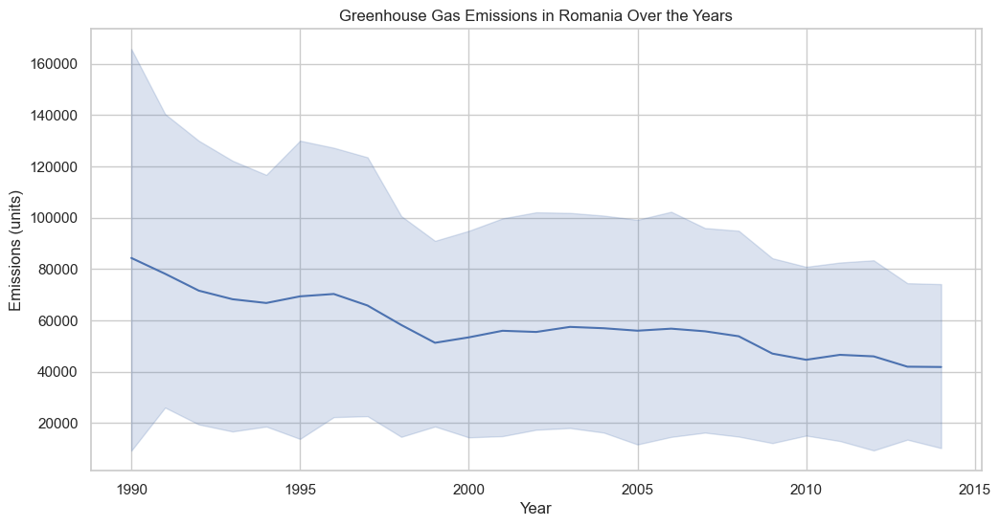

In [41]:
sns.set_style("whitegrid")

plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='value', data=ghg_romania)

plt.title('Greenhouse Gas Emissions in Romania Over the Years')
plt.xlabel('Year')
plt.ylabel('Emissions (units)')

plt.show()

It seems that European countries release vastly different amounts of GHG emissions, according to their industry, agriculture, culture, soil type, etc. Romania is one of the countries that releases a slightly lower quantity of emissions emitted from active power plants, compared to Serbia and Czech Republic. 

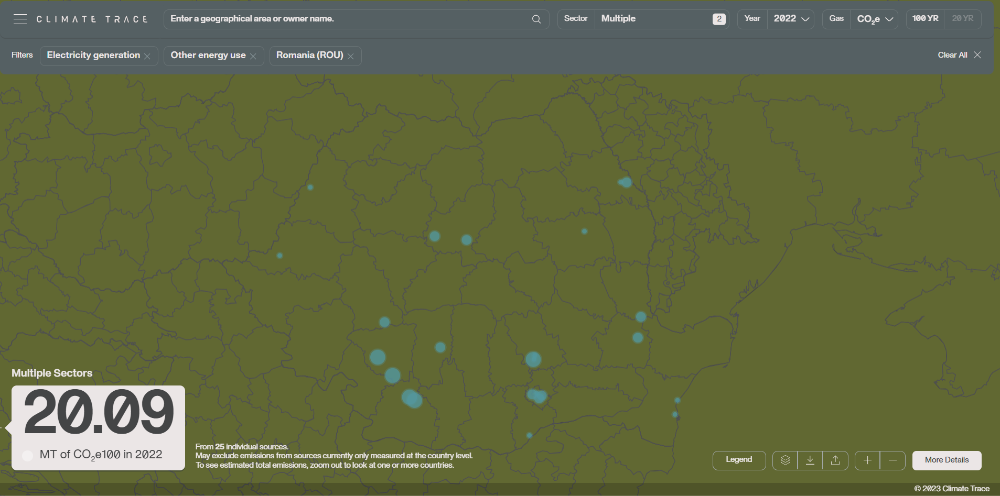

However, what some countries lack in emissions stemmed from power plants, they make up in emissions stemmed from manufacturing, mineral extraction, transport, and waste. In this case, Romania is releasing quite a high amount of emissions also contributing to the greenhouse effect. 


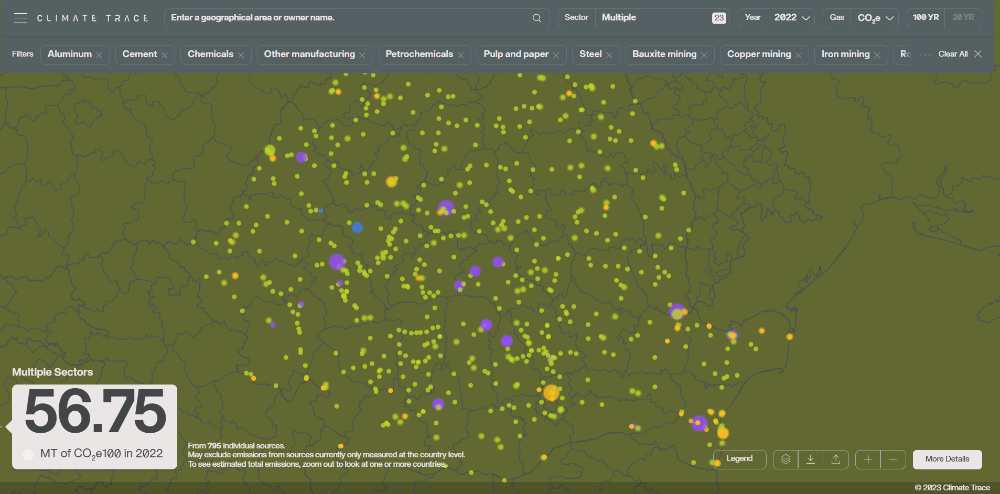

----------------------------

<h4> Temperature prediction 

<h4> ARIMA model

Looking 

Running an ARIMA model in order to predict temperature increase in the coming years, continuing with the same amount of activity Europe has. The 

You have an AR component that is auto regressive 
MA is moving average 

AR uses past values 
MA uses past errors as indicator 

First step is to create a new dataframe called temp_month_new, that has the representation of each first day of every month in every year in the previous dataframe, including the temperature. 


In [42]:
temp_month_new = pd.DataFrame()


month_to_int = {
    'January': 1, 'February': 2, 'March': 3, 'April': 4,
    'May': 5, 'June': 6, 'July': 7, 'August': 8,
    'September': 9, 'October': 10, 'November': 11, 'December': 12
}

temp_month_new['Day'] = [1] * len(temp_months)  # Adding a Day column with all values as 1
temp_month_new['Months'] = temp_months['Months'].map(month_to_int)  # Copying Month from temps_change
temp_month_new['Year'] = temp_months['Year']    # Copying Year from temps_change
temp_month_new['Temp'] = temp_months['Temp']    # Copying Temp from temps_change

temp_month_new.head(20)

,Day,Months,Year,Temp
0,1,1,1961,1.228
1,1,2,1961,1.722
2,1,3,1961,1.789
3,1,4,1961,0.886
4,1,5,1961,1.260
5,1,6,1961,1.045
6,1,7,1961,0.011
7,1,8,1961,-0.098
8,1,9,1961,-0.194
9,1,10,1961,-0.255


In [43]:
temp_month_new['Date'] = pd.to_datetime(temp_month_new[['Day', 'Months', 'Year']])
temp_month_new['Date'] = temp_month_new['Date'].dt.strftime('%d/%m/%Y')


temp_month_new.drop(['Day', 'Months', 'Year'], axis=1, inplace=True)

temp_month_new.head(20)

,Temp,Date
0,1.228,01/01/1961
1,1.722,01/02/1961
2,1.789,01/03/1961
3,0.886,01/04/1961
4,1.260,01/05/1961
5,1.045,01/06/1961
6,0.011,01/07/1961
7,-0.098,01/08/1961
8,-0.194,01/09/1961
9,-0.255,01/10/1961


In [44]:
#training data up to 2015 
#validation 2016 to 2019 

In [45]:
temp_month_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1416 entries, 0 to 1415
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Temp    1416 non-null   float64
 1   Date    1416 non-null   object 
dtypes: float64(1), object(1)
memory usage: 22.2+ KB


In [46]:
temp_month_new["Date"] = pd.to_datetime(temp_month_new['Date'])

In [47]:
train = temp_month_new.query("Date < '2016-01-01'")
test = temp_month_new.query("Date  >'2016-01-01'")

In [48]:
len(test)

94

I will be running two statistical models  to figure out the AR lag, which means the set number of months where the model might see differentiation in temperatures and the MA hyperparametre. 

Both components can be found through a PACF plot (AR) and a ACF plot (MA). The PACF plot stems from Partial Auto-Correlation Function plot and it is typically used in time series analysis to understand what parts are correlated within a forecasting dataframe.

Secondly, the ACF plot or the Autocorrelation Function plot is another visualisation tool that shows the linear relationship between a time series and its past observations. 

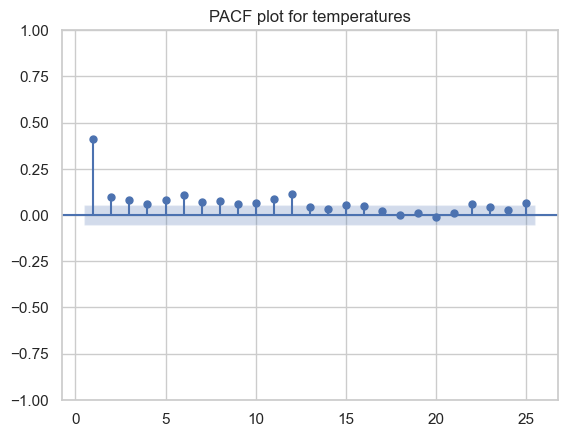

In [49]:
sgt.plot_pacf(train["Temp"], lags = 25, zero = False)
plt.title("PACF plot for temperatures")
plt.show()

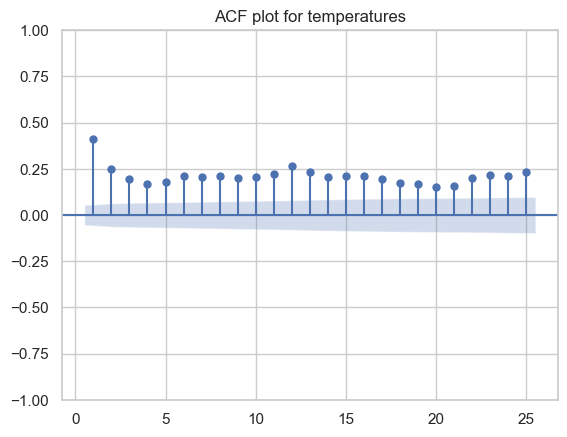

In [50]:
sgt.plot_acf(train["Temp"], lags = 25, zero = False)
plt.title("ACF plot for temperatures")
plt.show()

#this is to find past errors and for identifying the number of MA lags (moving average)

The results of the two plots are inconclusive, therefore I will be using an AR of 12 (it means it uses the last 12 months temperature to predict today's temperature), because that should show enough variation in temperature. Now I am going to I in ARIMA, which stands for integration which is the difference in temperature for each month (integration of 1)

In [51]:
arima_prediction = ARIMA (train['Temp'], order = (12, 1, 12))
results_arima_prediction = arima_prediction.fit()
results_arima_prediction.summary()

C:\Users\nicol\anaconda3\envs\AI2023\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\nicol\anaconda3\envs\AI2023\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\nicol\anaconda3\envs\AI2023\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   Temp   No. Observations:                 1320
Model:               ARIMA(12, 1, 12)   Log Likelihood               -1972.586
Date:                Thu, 21 Dec 2023   AIC                           3995.173
Time:                        23:34:05   BIC                           4124.789
Sample:                             0   HQIC                          4043.770
                               - 1320                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5311      2.286     -0.232      0.816      -5.011       3.949
ar.L2         -0.4417      1.775     -0.249      0.803      -3.920       3.037
ar.L3         -0.3648      1.281     -0.285      0.776      -2.876       2.146
ar.L4         -0.3841      1.044     -0.368      0.713      -2.431       1.662
ar.L5         -0.3048      1.113     -0.274      0.784      -2.485       1.876
ar.L6         -0.4417      0.981     -0.450      0.652      -2.364       1.481
ar.L7         -0.4334      1.188     -0.365      0.715      -2.763       1.896
ar.L8         -0.4832      1.255     -0.385      0.700      -2.943       1.977
ar.L9         -0.5588      1.385     -0.404      0.687      -3.273       2.155
ar.L10        -0.2969      1.532     -0.194      0.846      -3.299       2.706
ar.L11         0.1043      1.003      0.104      0.917      -1.861       2.070
ar.L12         0.0156      0.234      0.067      0.947      -0.442       0.474
ma.L1         -0.1894      2.285     -0.083      0.934      -4.668       4.289
ma.L2         -0.1289      0.425     -0.303      0.762      -0.962       0.705
ma.L3         -0.1100      0.568     -0.194      0.846      -1.223       1.003
ma.L4         -0.0307      0.527     -0.058      0.954      -1.064       1.002
ma.L5         -0.0933      0.395     -0.236      0.813      -0.868       0.682
ma.L6          0.1452      0.418      0.347      0.728      -0.674       0.965
ma.L7          0.0299      0.457      0.065      0.948      -0.865       0.925
ma.L8          0.0765      0.405      0.189      0.850      -0.718       0.871
ma.L9          0.0935      0.423      0.221      0.825      -0.735       0.922
ma.L10        -0.2353      0.425     -0.554      0.580      -1.068       0.598
ma.L11        -0.4560      0.609     -0.749      0.454      -1.649       0.737
ma.L12         0.0268      1.325      0.020      0.984      -2.570       2.624
sigma2         1.1633      0.035     33.707      0.000       1.096       1.231
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               295.21
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               1.71   Skew:                             0.16
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.30
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [52]:
arima_prediction = ARIMA(train['Temp'], order=(6, 1, 6))
results_arima_prediction = arima_prediction.fit()

print(results_arima_prediction.summary())


                               SARIMAX Results                                
Dep. Variable:                   Temp   No. Observations:                 1320
Model:                 ARIMA(6, 1, 6)   Log Likelihood               -1974.060
Date:                Thu, 21 Dec 2023   AIC                           3974.119
Time:                        23:34:10   BIC                           4041.519
Sample:                             0   HQIC                          3999.390
                               - 1320                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6137      0.211     -2.904      0.004      -1.028      -0.199
ar.L2         -1.0169      0.114     -8.923      0.000      -1.240      -0.794
ar.L3         -0.8614      0.259     -3.331      0.0

C:\Users\nicol\anaconda3\envs\AI2023\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [53]:
arima_prediction1 = ARIMA(train['Temp'], order=(12,1,12))
results_arima_prediction1 = arima_prediction1.fit()

print(results_arima_prediction1.summary())

C:\Users\nicol\anaconda3\envs\AI2023\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\nicol\anaconda3\envs\AI2023\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\nicol\anaconda3\envs\AI2023\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:                   Temp   No. Observations:                 1320
Model:               ARIMA(12, 1, 12)   Log Likelihood               -1972.586
Date:                Thu, 21 Dec 2023   AIC                           3995.173
Time:                        23:34:22   BIC                           4124.789
Sample:                             0   HQIC                          4043.770
                               - 1320                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5311      2.286     -0.232      0.816      -5.011       3.949
ar.L2         -0.4417      1.775     -0.249      0.803      -3.920       3.037
ar.L3         -0.3648      1.281     -0.285      0.7

In [54]:
start_index = len(train)
end_index = start_index + len(test) - 1
predictions = results_arima_prediction1.predict(start=start_index, end=end_index, typ='levels')

mae = mean_absolute_error(test['Temp'], predictions)
print(f"Mean Absolute Error: {mae}")

Mean Absolute Error: 0.958667765434774


C:\Users\nicol\anaconda3\envs\AI2023\lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


In [55]:
test

,Temp,Date
1321,5.860,2016-01-02
1322,4.434,2016-01-03
1323,3.744,2016-01-04
1324,1.665,2016-01-05
1325,1.938,2016-01-06
...,...,...
1411,2.448,2019-01-08
1412,1.614,2019-01-09
1413,2.357,2019-01-10
1414,2.063,2019-01-11


In [56]:
train["Temp"].describe()

count    1320.000000
mean        0.575006
std         1.244110
min        -4.352000
25%        -0.167000
50%         0.508000
75%         1.233000
max         7.074000
Name: Temp, dtype: float64

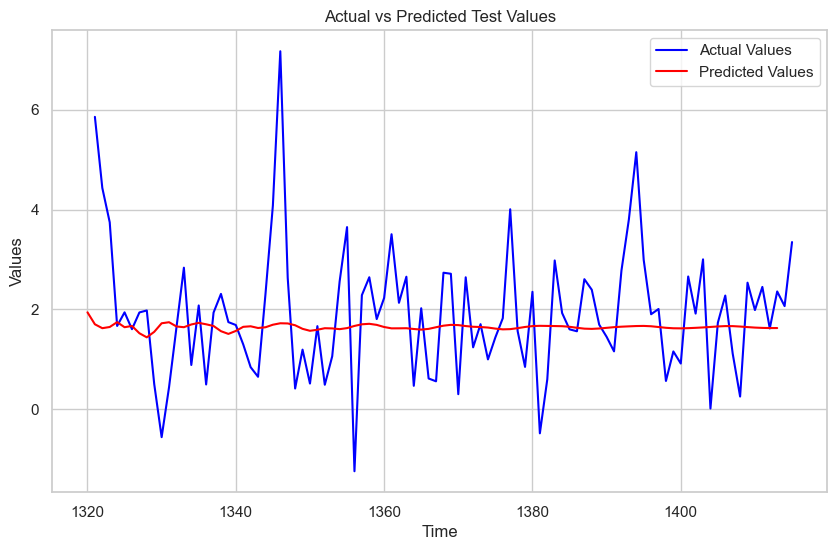

In [57]:
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))
plt.plot(test['Temp'], label='Actual Values', color='blue')
plt.plot(predictions, label='Predicted Values', color='red')


plt.title('Actual vs Predicted Test Values')
plt.xlabel('Time')
plt.ylabel('Values')
plt.legend()


plt.show()


In [58]:
start_index = len(train)


future_steps = 4 * 12  
end_index_future = start_index +len(test) +future_steps - 1  


future_predictions = results_arima_prediction1.predict(start=start_index, end=end_index_future, typ='levels')


C:\Users\nicol\anaconda3\envs\AI2023\lib\site-packages\statsmodels\tsa\statespace\representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


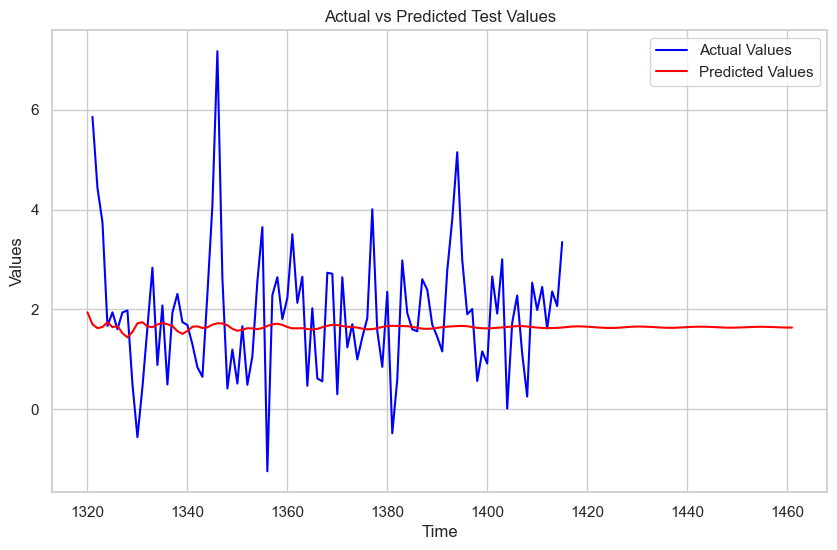

In [59]:
plt.figure(figsize=(10, 6))
plt.plot(test['Temp'], label='Actual Values', color='blue')
plt.plot(future_predictions, label='Predicted Values', color='red')

plt.title('Actual vs Predicted Test Values')
plt.xlabel('Time')
plt.ylabel('Values')
plt.legend()

plt.show()


<h4> Auto-ARIMA model

In [60]:
train

,Temp,Date
0,1.228,1961-01-01
1,1.722,1961-01-02
2,1.789,1961-01-03
3,0.886,1961-01-04
4,1.260,1961-01-05
...,...,...
1315,1.962,2015-01-08
1316,1.041,2015-01-09
1317,1.134,2015-01-10
1318,2.153,2015-01-11


In [61]:
auto_arima_temp = auto_arima(train['Temp'][1:],
                        max_order = None, m = 12 ,max_p = 5, max_q = 5, max_d = 1,
                        max_P = 3, max_Q = 3, max_D = 1, maxiter = 30, alpha = 0.05,
                        information_criterion= 'oob',trend = 'ct', out_of_sample_size= int(len(train) * 0.2))

C:\Users\nicol\anaconda3\envs\AI2023\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\nicol\anaconda3\envs\AI2023\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\nicol\anaconda3\envs\AI2023\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\nicol\anaconda3\envs\AI2023\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index wi

In [62]:
auto_arima_temp

ARIMA(maxiter=30, order=(2, 1, 0), out_of_sample_size=264, scoring_args={},
      seasonal_order=(2, 0, 1, 12), suppress_warnings=True, trend='ct',
      with_intercept=False)

First ARIMA are regular hyperparameters and the second lot are seasonal hyperparameters. 

In [63]:
auto_arima_temp.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                 1319
Model:             SARIMAX(2, 1, 0)x(2, 0, [1], 12)   Log Likelihood               -2130.127
Date:                              Thu, 21 Dec 2023   AIC                           4276.253
Time:                                      23:43:10   BIC                           4317.724
Sample:                                           0   HQIC                          4291.803
                                             - 1319                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.0075      0.073     -0.103      0.918      -0.151       0.136
drift       1.211e-05   8.75e-05      0.138      0.890      -0.000       0.000
ar.L1         -0.4821      0.019    -25.061      0.000      -0.520      -0.444
ar.L2         -0.2678      0.022    -11.926      0.000      -0.312      -0.224
ar.S.L12       0.0957      1.284      0.075      0.941      -2.420       2.612
ar.S.L24      -0.0152      0.147     -0.104      0.917      -0.302       0.272
ma.S.L12       0.0189      1.282      0.015      0.988      -2.493       2.531
sigma2         1.3682      0.039     34.656      0.000       1.291       1.446
===================================================================================
Ljung-Box (L1) (Q):                   1.11   Jarque-Bera (JB):                84.89
Prob(Q):                              0.29   Prob(JB):                         0.00
Heteroskedasticity (H):               1.88   Skew:                             0.14
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.21
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [64]:
forecast = auto_arima_temp.predict(n_periods=len(test), return_conf_int=False)

In [65]:
forecast

array([1.73734627, 1.71368644, 1.84706408, 1.90140852, 2.04055759,
       1.98952679, 2.17434708, 2.01082025, 1.90516807, 1.92745012,
       2.03692337, 2.0136579 , 2.00898406, 2.03049112, 2.03038245,
       2.03484454, 2.03825071, 2.04551977, 2.0464356 , 2.05779862,
       2.06669608, 2.07238663, 2.07233797, 2.07355643, 2.08600143,
       2.0934349 , 2.0964126 , 2.10103869, 2.10427875, 2.11079327,
       2.11311274, 2.12174713, 2.12927055, 2.13454452, 2.13794746,
       2.14350118, 2.14985325, 2.15533356, 2.16072361, 2.16620873,
       2.17158417, 2.17722114, 2.18256024, 2.18835159, 2.19408109,
       2.19965102, 2.20513621, 2.21081491, 2.21640589, 2.2219967 ,
       2.22765368, 2.23330156, 2.23896699, 2.24461447, 2.25030428,
       2.25594808, 2.2616098 , 2.26729745, 2.27301241, 2.27872004,
       2.28441403, 2.29012821, 2.29585701, 2.30159042, 2.30733409,
       2.31307898, 2.31883938, 2.3245954 , 2.330361  , 2.33613843,
       2.34192669, 2.34771822, 2.35351669, 2.35932402, 2.36513

In [66]:
mae_auto = mean_absolute_error(test['Temp'], forecast)
print(f"Mean Absolute Error: {mae}")

Mean Absolute Error: 0.958667765434774


In [67]:
test.index

Index([1321, 1322, 1323, 1324, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1333,
       1334, 1335, 1336, 1337, 1338, 1339, 1340, 1341, 1342, 1343, 1344, 1345,
       1346, 1347, 1348, 1349, 1350, 1351, 1352, 1353, 1354, 1355, 1356, 1357,
       1358, 1359, 1360, 1361, 1362, 1363, 1364, 1365, 1366, 1367, 1368, 1369,
       1370, 1371, 1372, 1373, 1374, 1375, 1376, 1377, 1378, 1379, 1380, 1381,
       1382, 1383, 1384, 1385, 1386, 1387, 1388, 1389, 1390, 1391, 1392, 1393,
       1394, 1395, 1396, 1397, 1398, 1399, 1400, 1401, 1402, 1403, 1404, 1405,
       1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1414, 1415],
      dtype='int64')

Trying to predict future temperatures. The models have achieved an MAE of x on the test set. It is not a fantastic result, but it still shows some predictions of trends in temperature changes. Ideally, the models would have followed the trend of the real data, we could have used that to see the future trends of temperature changes. 

However, the two models are a good start for future hyperparameter tuning. Further work and time is necessary in order to find the correct combination of effective hyperparameters. Calculate the mean for the target variable (Temp) and compare it to the MAE for both ARIMA and Auto Arima. 

Talk about the differences between arima and auto arima and why I chose those - revisit what you talked about in the methodology. 

In [68]:
mean_value = test['Temp'].mean()

In [69]:
mean_value

1.9140638297872343

As a reminder, through both models ran above, we attempted to predict how the temperature will change over time. Both models had MAEs (Mean Absolute Error) of is 0.958667765434774, which is not enough to be able to predict anything. However, it still shows some predictions of trends in temperatures. Ideally, the models would have followed the trend of the real data and have a low MAE which would represent a better fit to the data. Compared to the mean value of the target variable ('Temp') of 1.9140638297872343, both models' MAE were quite far away from predictions. 

Having said that, both models showed promise in predicting temperature trends and with enough time and further work, they can identify the correct patterns. I believe that more hyperparameter tuning is needed for that. 

As a reminder, the difference between ARIMA and auto-ARIMA models is that the first allows us to tune the hyperparameters ourselves, whereas auto-ARIMA computes all possibilities of combinations between hyperparameters, and renders only the best combination. The 

--------------------

<h4> "Underfinanced. Underprepared. Inadequate investment and planning on climate adaptation leaves world exposed" - Adaptation Gap Report 2023 (IPCC)

So far this report has looked at the increase in temperatures across the world, the common causes that might cause that, such as the increase in grenehouse gas emissions stemmed from human activity. Based on the ARIMA, Auto-ARIMA and LSTM models, it seems temperatures will continue to increase, so it is necessary to look at how the global population is adapting to this new "normal". 

The IPCC Adaptation Report 2023 is an extensive piece of research, that looks at all the advantages and disadvantages of all the actions that countries are taking in order to cut emissions. The report also focuses on the increase of natural disasters. 

According to the report, the estimated adaptation costs and needs for developing countries are significantly higher than previous estimates. Also, the adaptation finance gap is likely 10-18 times as great as current international adaptation finance flows - at least 50 per cent higher than previous range estimates. 

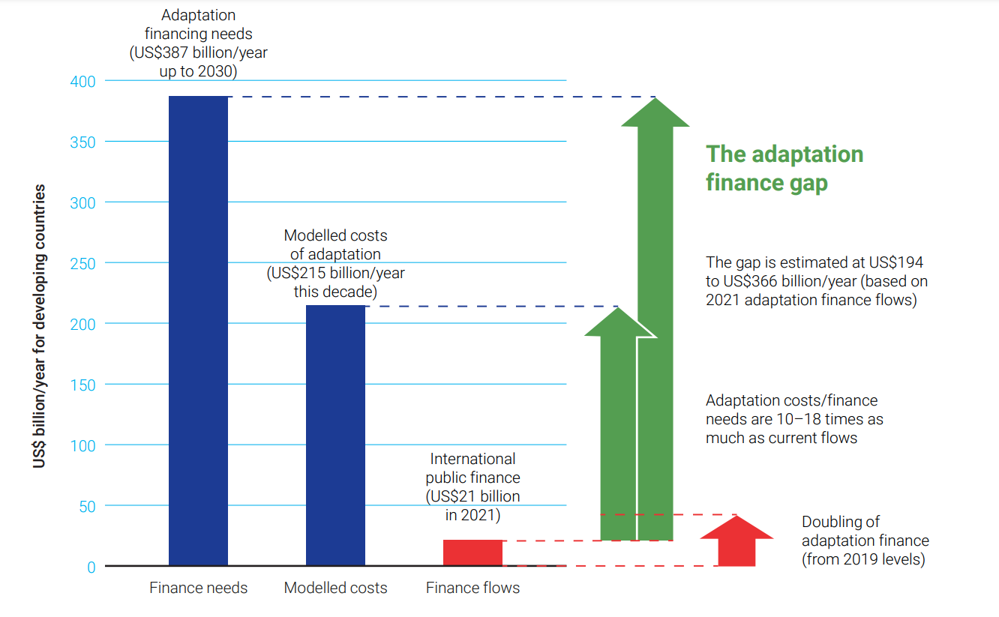

<h4> Financial steps to bridge the gap 

There is a high discrepancy between the adaptation finncial needs and the amount of public finance available for aid. Thinking of the previous graphic that shows the ones in poverty line are responsible for only 8 per cent of emissions, it seems that they are also the ones suffering most from the adaptation financial gap. 

The IPCC adaptation report has identified seven ways to bridge the adaptation gap. The core three are international public adaptation finance, domestic expanditure on adaptation and private-sector finance. The remaining four actions are additional approaches that could be taken, however it requires a greater international cooperation to be able to achieve them. 

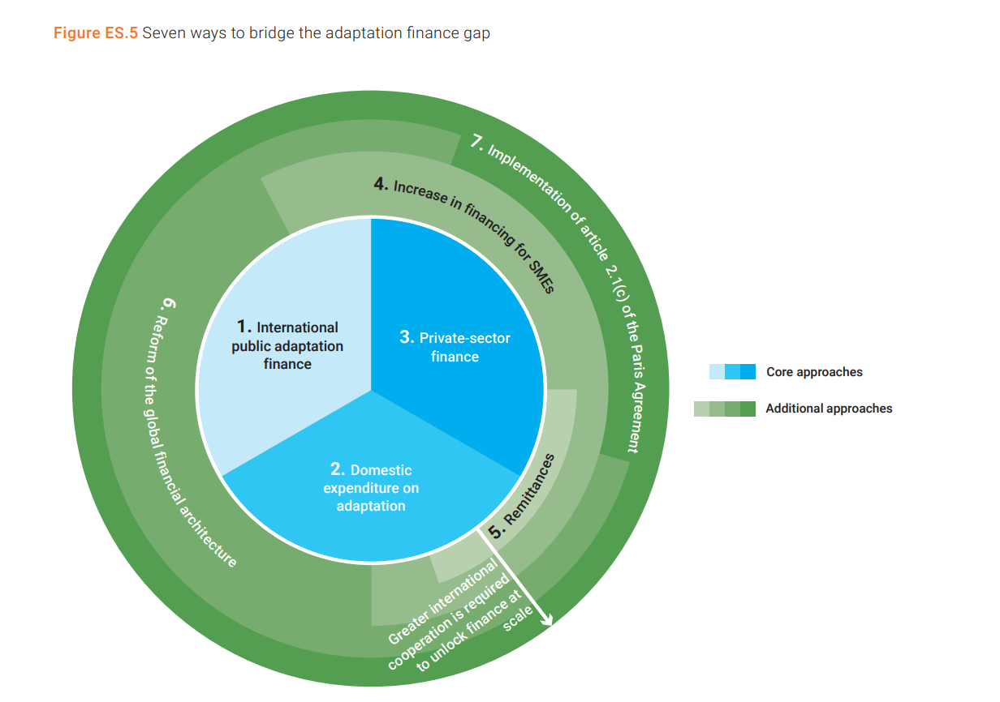

<h4> Lack of policy and disinterest </h4> 

In terms of taking steps to adapt and mitigate to climate events, the IPPC reports that roughly 85 per cent of country have some sort of national-level adaptation planning instrument. However, of the 15 per cent of countries that do not yet have a national planning instrument in place, just under half of these were found to be in the process of developing one.

Another barried in the adaptation gap is the lack of conceptual clarity in order to make political and operational progress on loss and damage, which translates into poor policy not covering those who need protection the most. 

The IPCC report stresses the importance of the mitigatation, adaptation and residual risk *before* a climate change effect takes place. It can help avert loss and damage, but also saves human life. 

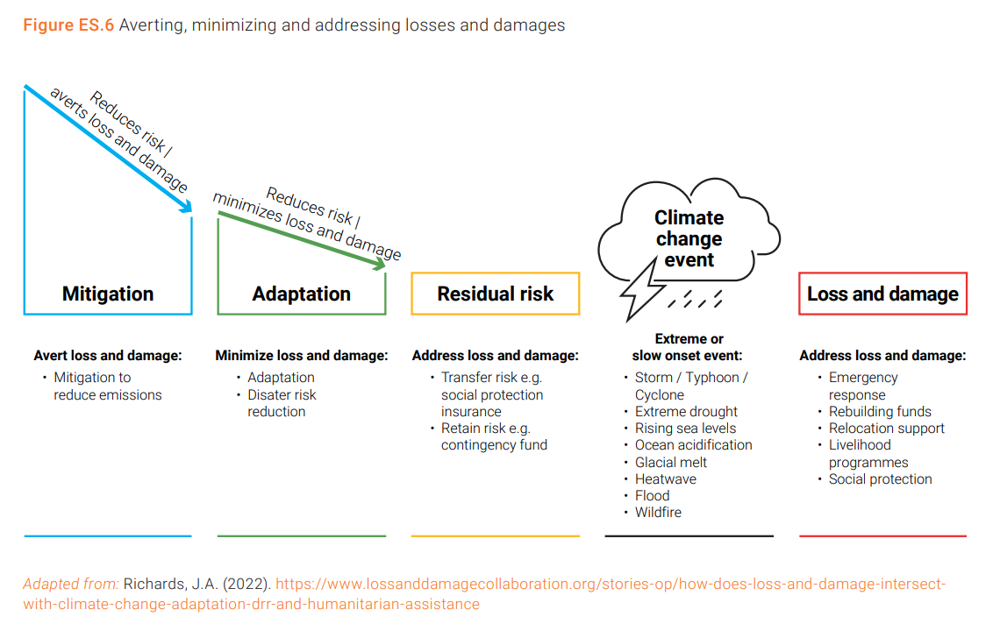

The science that drives the IPCC report shows that roughly 40 per cent of the population is living in highly climate-vulnerable areas (Birkmann et al, 2022) and the world is on track to experience dangerous climate risk levels before the end of the twenty-first century. 

The Adaptation report has created a case study titled *"Case Study: Cascading impacts and floods – Building adaptive capacity in Pakistan"*, that discusses the increasing frequency of climate extremes in Pakistan, that have causes loss of life and a reversal of development gains. Flooding seems to result in greater loss of life and damage to property than other natural hazards. The intensity of these events has increased since 1947. 

At the national level, national policies and programmes provide the enabling environment for the proliferation of options for averting, minimizing and addressing loss and damage. With growing concern for cascading, compounding and transboundary climate risks, there is more need for regional cooperation in implementing regional-level measures for addressing loss and damages. To date, only regional catastrophic insurance mechanisms are clearly visible options available and there is a need to explore more regional cooperation measures that have the synergistic impact of addressing losses and damages at the regional to local level. Such measures should take into consideration the ecosystems, sharing regional early warnings, trade and supply chains and financial markets. 


<h4> Besides financial steps and policy, how else can we help the gap? </h4> 

The IPCC report stresses the importance of early warning systems, being cost-effective for the adaptation to climate events. However, the modelling can be as good as data, therefore there seems to be a gap in basic weather and climate data that undermines the effective adaptation in many countries. 

Investing in data gathering and monitoring could be one step ahead towards climate adaptation. While the occurrence of flash floods and landslides cannot be prevented, the amount of loss and damage can be reduced significantly with timely early warning services. Advances in Bhutan show how the data gap can be
narrowed by rehabilitating and restoring weather stations, in addition to building country knowledge and experience.

<h4> How do we assess loss? </h4> 

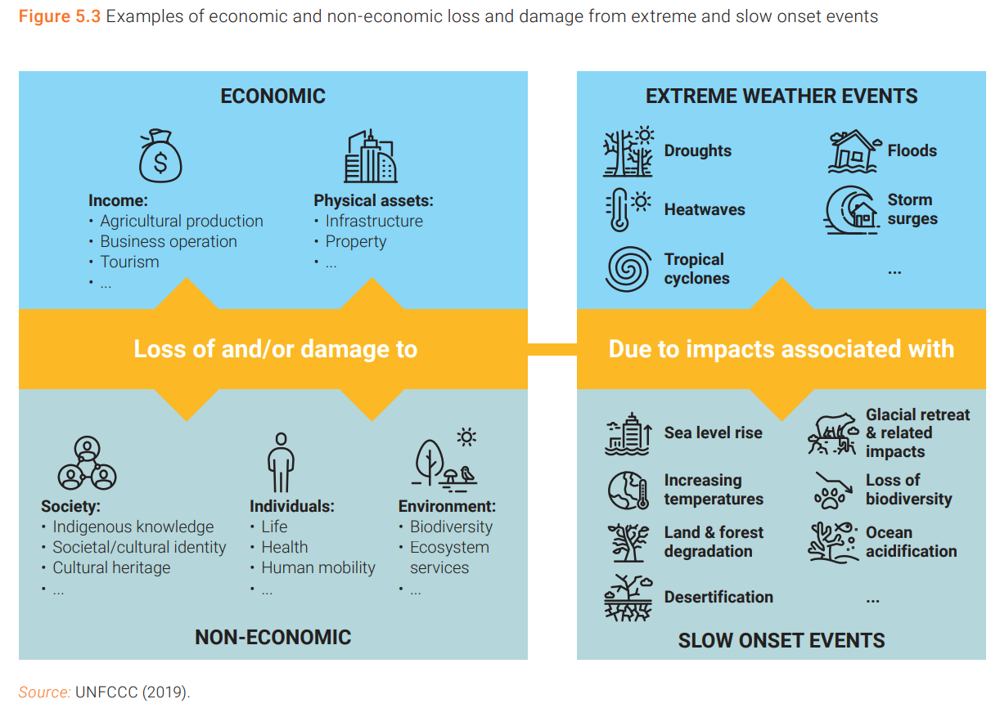

The IPCC report shows several types of loss and damage: 

<ul> 
    <li> Non-economic: socirty, invididuals, environment
        <li> Economic: income and physical assets 
            <li> Extreme Weather Events: droughts, floods, heatwaves, storm surges, tropical cyclones
                <li> Slow Onset Events: sea level rise, increasing temperatures, land & forest degradation, desertification, glacial retreat & related impacts, loss of biodiversity, ocean acidification 
                    </ul>


Judging by the slw onset events depicted in the above image, it seems increasing temperatures and floods are just a small part of all the losses that can affect the society as we know it. Many other losses can take place, and can affect the bottom 50 per cent of people, or 3.9 billion people. (according to the figure on separation of population above). The result is unavoidable loss and damage to way of life, culture, biodiversity, land, livelihoods, agency, assets and social cohesion.

<h4> Are there any measures in place that are recommended to prevent loss? </h4> 

IPCC created a comprehensive selection of actions associated with economic and non-economic loss and damage. 

1. Economic loss and damage: 
<ul> 
    
    <li> Ahead of the event impact: social protection measures, pre-disaster financial support, risk layering, risk retention, risk transfer, early warning and impact based forecasting, loss and damage databases to support decision-making, planned relocation and assisted migration, and social protection measures </li>
        <li> During or following the event: humanitarian assistance, short and long term recovery and rehabilitation, support for rebuilding livelihoods, rebuilding damaged infrastructure, compensation. </li>
            
</ul> 

2. Non-economic loss and damage 
<ul> 
    
    <li> Ahead of the event impact: early warning and impact based forecasting, assisted migration that enables timely evacuation, investment in the safeguard of cultural heritage and support for intangible cultural heritage, the development of culturally sensitive and people-centered planned relocation guidelines and processes  </li>
        <li> During or following the event: reparations to ensure future wellbeing following loss, recognition of loss and repair of damage, active remembrance, councelling, support for communities to preserve their unique culture and social ties, enabling safe visits to abandoned sites, conservation and restoration of ecosystems and biodiversity </li>
            
</ul> 

<h4> Adaptation report discussion </h4> 

The IPCC report showed several distressing factors that are cause for concern. Firstly, the lack of policy at both regional and international level show that there is a severe lack of accountability for most countries. Secondly, the lack of funding for climate adaptation shows that those that are able to contribute are rarely the ones affected by the climate events, and yet there is no mutual consensus to prevent both loss of life and damage to property through financial aid. Thirdly, the report clearly states that it is better to prevent, rather than treat damage and loss of any kind. There are multiple ways of forecasting most climate events through weather and regional data, however there is a lack of data gathering or good quality data that can be used for such modelling. Fourthly, there are multiple measures that can be put in place to prevent both economic and non-economic loss, both raging from social protection measures to early warning, to assisted migration and conservation of ecosystems and biodiversity. 

It seems however there is resilience in adopting these measures by policy makers and governmental bodies. Perhaps the lack of accountability is one of the main reasons we are not adopting adaptation measures. As mentioned in the ethical considerations, one of the reasons Climate Trace was founded was due to poor reporting from countries, often late or incomplete. In the next section I will be briefly discussing how to use Climate Trace in order to increase national accountability when it comes to emissions. 

<h4> Climate Trace </h4> 

According to the Climate Trace Case studies page https://climatetrace.org/case-studies, all of the states participating in this project previously had access to varying levels of emissions data, but many reported that it was difficult to source and generate their own inventories. As a result, their data were incomplete and often only updated every few years. Climate TRACE is able to fill in these gaps and generate independent emissions estimates that don’t primarily rely on self-reported data. Climate TRACE pairs satellite and remote sensing data with artificial intelligence to identify emitting activities and calculate greenhouse gas emissions.

According to RMI https://rmi.org/insight/intel-from-above-spotting-methane-super-emitters-with-satellites/, Satellites will play an important role in making invisible methane visible, including in places that are otherwise off limits or difficult to reach for measurement. Consider unreported leakage such as that from offshore oil and gas systems and liquefied natural gas supply chains where methane releases have long been hidden owing to challenges in detecting methane over water. The best way to view such methane super-emitters is with satellites, especially those capable of global observation. 

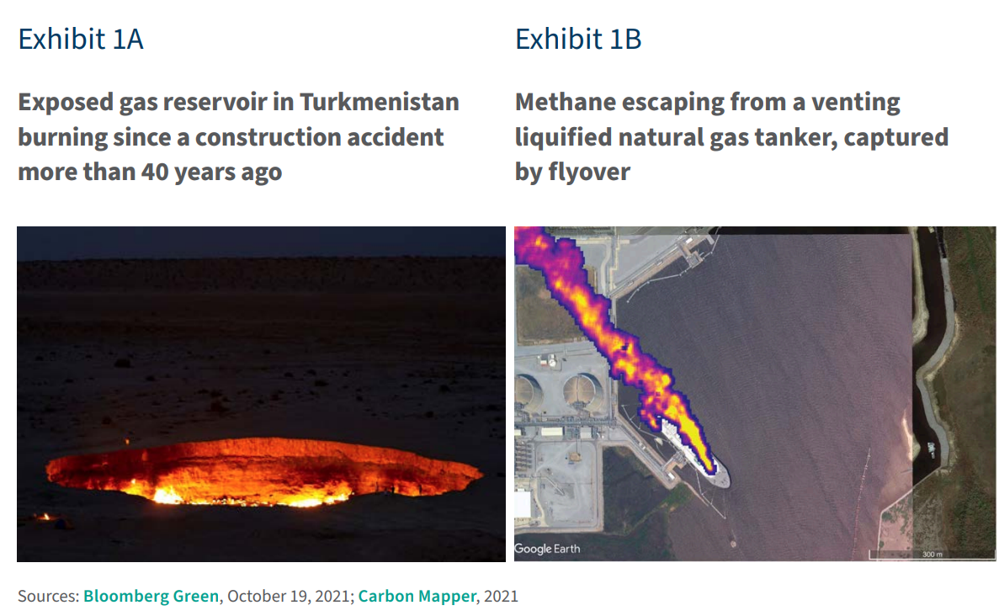

New satellite-based monitoring systems, including both single satellites and constellations of satellites, are particularly promising thanks to their ability to rapidly detect, locate, and quantify the largest methane point source emissions worldwide. 

The satellite data captioning is using three key parameters in order to provide complete and truthful data: 

<ul> 
    
<li> The emissions rate must be at or above the satellite instrument’s minimum detection limit (MDL), which is typically expressed as an emissions rate of methane mass (kilograms CH4 per hour, kg CH4/hr) or volume (standard cubic feet per hour, scf/hr).
    <li> The emissions source must fall within the area imaged by the satellite, which is determined primarily by the spatial coverage of the satellite.
        <li>The emissions source must be active while the satellite is overhead and must not be obstructed by poor atmospheric conditions (e.g., clouds or smoke).ii This parameter is affected by a satellite’s sample frequency, or how often a satellite successfully completes an observation of a given area.
</ul>            

https://transitionzero.medium.com/estimating-coal-power-plant-operation-from-satellite-images-with-computer-vision-b966af56919e


Understanding how satellites "see" the emissions from space, made me want to look at a few examples of the countries that this report looked at so far. Using the Google Earth Engine, I looked up at two power plants from Romania and Czech Republic. These images were captured on 21/12/2023. 

Below is the Govora power plant, in Romania. It seems the satellite caught it right when it was emitting some vapours. 

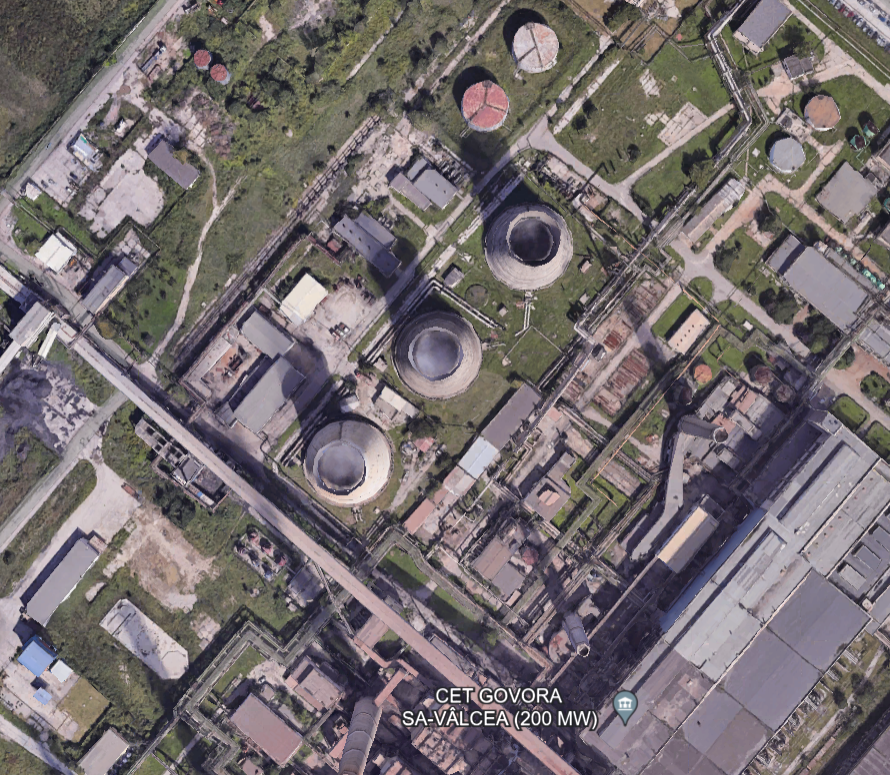

Below is the Chvaletice power station from Czech Republic. 


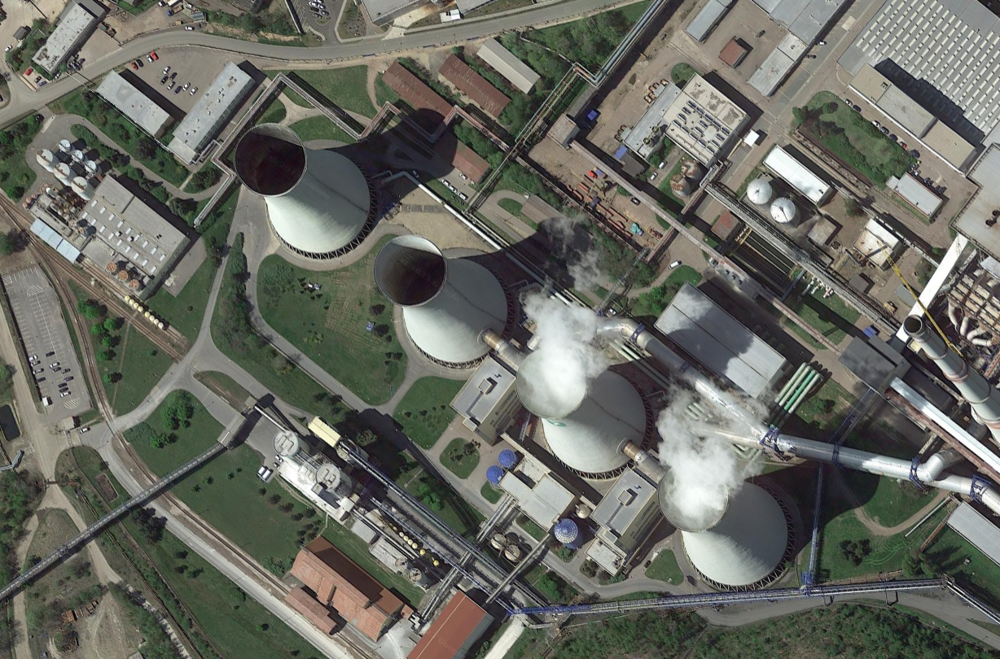

Now that we see what satellites see from space, we can understand how satellites can take data (pictures) in the interest of monitoring emissions but also foreseeing natural disasters happening. This reinforces the funding needed to be invested in environmental work for adaptation and mitigation. With the "eyes in the sky" (the satellites) and machine learning models, we can continue to gather complete and accurate data and use it to the advantage of humanity. 

-------------------------

<h4> Conclusion </h4> 

This report was the continuation of the proposal done in coursework 1 by Rosca (2023), investigating the causes that lead to the worst natural disaster that was seen in Europe in the last 10 years, in Serbia. The flood was caused by increased precipitation by Storm Yvette and affected over 1600000 people, and therefore this report looked at how precipitations increased so much and why. 

For this investigation, I looked at the worldwide opinion on the "worldnews" subreddit, that showed most people were either looking for donations or requesting information about areas where friends and family were located. The rest of the webscraping also showed horrific images with parts of Serbia submerged under muddy water, but also the increase of CO2 emissions since 1850 that had a dramatic upwards trajectory since 1960. 

The following section of the report looked at trends in temperature changes accross Europe since 1961. According to the visualisations we have done, there has been a steady increase in temperatures in 1990 with a sharp increase around 2013 and 2014. The temperature continue to increase to this day, due to human acitvity that emits greengouse gas emissions and creates a greenhouse effect. The warm air trapped between soil and the atmoshpheric layer is what is causing increased precipitation that leads to fast flash floods that endanger human life and damages property. We now know that the Serbian floods of 2014 were specifically caused by a low-pressure cyclone that formed over the Adriatic Sea due to polar air from Central Europe meeting with the humid subtropical air of the Mediterranean basin between 13th and 18th May. It is believed that the cyclone was an anomaly looking at the weather data of past years, and it was caused by the greenhouse effect. 

In this report we also looked at the correlation between poverty and natural disasters. We now know that the top 10 per cent of high income individuals are responsible for 49 per cent of the emissions globally. However, according to the ReliefWeb Humanitarion report, the floods affected those who are already living in poverty, in mobile homes or on the streets and 110000 people that were part of the social welfare have been affected and required immediate assistance. The IPCC report confirmed that this is true for all natural disasters and there is a trend that shows the policy makers, governmental bodies and the 10 per cent of high income individuals still refuse to gather enough funds for climate adaptation and mitigation for measures that can save both human life and property. 

This notebook also looked closely at the number one reason why Serbia emits such high greenhouse gas emissions. Coal mining for electricity seems to be widely spread around the country, with 72.43 per cent of the Serbian population using electricity sourced from coal in 2014. The energy sector is dominated by the state owned power utility EPS. Regardless of how much it has been proven that emissions impact climate patterns, there is no plan to stop generatig power through coal. However, during the floods of 2014, several power plants were  flooded with mining machinery deemeds not usable. 

However, Serbia is not the only country in Europe that contributes to such high emissions. I looked at its two neighbours, Czech Republic and Romania and with the help of the Climate Trace data I have identified that Czech Republic is also responsible for quite a large amount of emissions stemmed from the power sector. Romania seems to emit lower amounts of emissions from the power sector, however makes up in waste, transport, manufacturing, and mineral extraction with 56.75 MT of CO2 in 2022. The conclusion based on all of these facts is that Serbia is not the only one responsible for the immense amount of emissions, but it is in fact a team effort. However, this team effort created climate events that will inevitably continue to pose a danger to life and property unless countries start to take measures against emissions.  

The IPCC adaptation report has highlighted the lack of funding for adaptation measures, but also nudged towards measures that can be put in place *before* a climate event takes place, such a slow migration from high risk areas, protection of cultural documents and items, better data gathering for environmental and weather modelling. IPCC also showcased the importance of keeping countries accountable to the global measures that are put in place for climate mitigation and adaptation. As Climate Trace has showed, most environmental data is self reported by countries which can lead to either incomplete or false data. 

This notebook has completed an overview of trends in temperature changes, greenhouse gas emissions, European countries and the power sector. It has brought to light multiple issues when it comes to climate adaptation and mitigation, including lack of funding, increased poverty and natural disasters. There are multiple sources regarding environmental adaptation, however this report was focused on non-academical but verified sources that use current data of trends and patterns in the greenhouse gas emissions field. 

For future work, it is recommended that the ARIMA and auto-ARIMA models are further tuned to identify more patterns in the data. Additionally, more research is needed when it comes to anticipatory action for natural disasters that can shape the future of humanity. 








--------------------------

<h4> References

Rosca, N. (2023) PROPOSAL : The impact of natural disasters on the European population. An analysis of the natural disasters that took place between 2013 and 2023 in Eastern and Southern Europe. rep. London, London. 

Support us (no date) Climate TRACE. Available at: https://climatetrace.org/support-us (Accessed: 21 December 2023). 
Team + Partners (no date) Climate TRACE. Available at: https://climatetrace.org/team (Accessed: 21 December 2023). 
The bottom line on Ground Truth Data (2023) Climate TRACE. Available at: https://climatetrace.org/news/the-bottom-line-on-ground-truth-data (Accessed: 21 December 2023). 

IPCC procedures (no date) IPCC. Available at: https://www.ipcc.ch/documentation/procedures/#:~:text=The%20IPCC%20is%20funded%20by,member%20governments%20and%20the%20UNFCCC (Accessed: 21 December 2023). 
(No date) IPCC factsheet how does the IPCC approve reports? Available at: https://www.ipcc.ch/site/assets/uploads/2021/07/AR6_FS_approve.pdf (Accessed: 21 December 2023). 

Nations, U. (2017) International Greenhouse Gas Emissions, Kaggle. Available at: https://www.kaggle.com/datasets/unitednations/international-greenhouse-gas-emissions (Accessed: 21 December 2023). 

Undata | Conditions of use (no date) United Nations. Available at: https://data.un.org/Host.aspx?Content=UNdataUse (Accessed: 21 December 2023). 
Hayes, A. (no date) Autoregressive integrated moving average (ARIMA) prediction model, Investopedia. Available at: https://www.investopedia.com/terms/a/autoregressive-integrated-moving-average-arima.asp#:~:text=Autoregressive%20integrated%20moving%20average%20(ARIMA)%20models%20predict%20future%20values%20based,to%20forecast%20future%20security%20prices (Accessed: 21 December 2023). 

Singh, A. (2023) Build high performance time series models using Auto Arima in python and R, Analytics Vidhya. Available at: https://www.analyticsvidhya.com/blog/2018/08/auto-arima-time-series-modeling-python-r/#h-what-is-auto-arima (Accessed: 21 December 2023). 

Bosnia and Serbia emergency after ‘worst ever’ floods (no date) reddit. Available at: https://old.reddit.com/r/worldnews/comments/25pcse/bosnia_and_serbia_emergency_after_worst_ever/ (Accessed: 21 December 2023). 
Bosnia and Serbia emergency after ‘worst ever’ floods (2014) BBC News. Available at: https://www.bbc.co.uk/news/world-africa-27439139 (Accessed: 21 December 2023). 

Climatechangetracker.org (no date) Yearly atmospheric CO2 Increase: Insights, data, and implications, Yearly Atmospheric CO2 Increase: Insights, Data, and Implications. Available at: https://climatechangetracker.org/co2/yearly-atmospheric-co2-increase (Accessed: 21 December 2023). 
Serbia floods: Humanitarian situation report - 30 May 2014 - serbia (2014) ReliefWeb. Available at: https://reliefweb.int/report/serbia/serbia-floods-humanitarian-situation-report-30-may-2014 (Accessed: 21 December 2023). 

Marcus Lu (2023) Charted: Global CO2 emissions by Income Group, Visual Capitalist. Available at: https://www.visualcapitalist.com/co2-emissions-by-income/ (Accessed: 21 December 2023). 

(2017) Second National Communication of the Republic of Serbia under ... - UNFCCC. Available at: https://unfccc.int/sites/default/files/resource/SNC%20Eng_Serbia.pdf (Accessed: 22 December 2023). 

Serbia coal usage/consumption 1990-2023 (no date) MacroTrends. Available at: https://www.macrotrends.net/countries/SRB/serbia/coal-usage-consumption (Accessed: 22 December 2023). 

The energy sector in Serbia (2023) Bankwatch. Available at: https://bankwatch.org/beyond-fossil-fuels/the-energy-sector-in-serbia (Accessed: 22 December 2023).

Environment, U. (2023) Adaptation gap report 2023, UNEP. Available at: https://www.unep.org/resources/adaptation-gap-report-2023 (Accessed: 22 December 2023).

Case studies (no date) Climate TRACE. Available at: https://climatetrace.org/case-studies (Accessed: 22 December 2023). 

Intel from above: Spotting methane super-emitters with satellites (2023) RMI. Available at: https://rmi.org/insight/intel-from-above-spotting-methane-super-emitters-with-satellites/ (Accessed: 22 December 2023). 

Team, T.-T. (2023) Estimating coal power plant operation from satellite images with Computer Vision, Medium. Available at: https://transitionzero.medium.com/estimating-coal-power-plant-operation-from-satellite-images-with-computer-vision-b966af56919e (Accessed: 22 December 2023). 